# Faulty Car Prediction Model - "Avoid getting Kicked"
# Part 1: Visualization and Data Preprocessing


# 1.1 Business Understanding Overview
  
From the moment a vehicle is driven off a dealer’s lot by a consumer, that vehicle becomes a used car.  Today there are more than 263 million vehicles saturating US roads comprised of only 6% new vehicles retailed in 2018.  Last year consumer bought over 40 million used vehicles, about 2.5x the number of new cars sold.  2018 used vehicle sales accounted for 70% of industry volume and roughly 57% of total market value. 

For the past few years, the market has seen a high percentage of purchases happening upstream (lease or direct purchase from manufacturers) that has helped constrained inventory supply available for auction.  The limited supply has helped prevent auction market prices from falling.  However, with more than 300,000 more vehicles coming off lease in 2019 vs. last year, continued price stabilization remains uncertain.  

A wide range of employers are actively responsible for production supply of the used car industry, including independent used car dealers, wholesale auctions, rental car companies, and vehicle manufacturers. According to The National Auto Auction Association, wholesale auctions represent approximately 25% the industry market share having sold more than 9.9 million vehicles in 2018.  Auto auctions provide a way for auto dealerships to purchase used car vehicles at bargain prices.  However, one of the biggest challenges of an auto dealership purchasing a used car at an auto auction is the risk of that the vehicle might have serious issues that prevent it from being sold to customers. The auto community calls these unfortunate purchases "kicks”.  

Kicked cars often result when there are tampered odometers, mechanical issues the dealer is not able to address, issues with getting the vehicle title from the seller, or some other unforeseen problem.  This is because many auctions do not allow the buyer to inspect the vehicle prior to purchase. Based on these conditions, approximately 12% or 1.2 million vehicles sold at auto auctions are classified as “kicks”.   

“Kicks” are vehicles sold at a lost, or present risk to the dealership reputation and can be very costly to dealers after transportation cost, throw away repair work and market losses in reselling the vehicle.  For these reasons, auto dealerships can benefit greatly from the predictive powers of machine learning.  By utilizing a  data mining approach to determine which cars have a higher risk of being kick, we can provide real value to dealerships trying to provide the best inventory selection possible to their customers.

We intend to show through our analysis a detailed review of the dataset by exploring the statistical summaries  and visualizing the attributes to determine if a predictive model relationship exists for “kicks” as it relates to the other 31 variables related to car auction. 

## 1.1.1 Data Collection  
The dataset used through out this analysis was obtained from the Kaggle challenge "Don’t Get Kicked" hosted by Carvana. Carvana is a start-up business that is being launch by a well-established American company. Its goal is to completely change the way people buy, finance, and trade their used vehicles by replacing physical infrastructure with technology and top of the line scientific models. It is an ambitious project that will require building new analytics and systems for which there are no precedent5.
The data set contains 32 unique features with 73,041 samples along with a labeling of 0 for good car purchases and 1 for "kicks". Key features include odometer readings, selling prices, vehicle age, and vehicle model.


# 1.2 Data Understanding  

The raw dataset consists of 72983 observations, with 34 total variables, 1 of which represents a unique index for the cars purchased. In terms of breakdown, there are:

- 1 Reference ID
- 8 Ordinal features, 2 of the 8 being boolean
- 14 Categorical features
- 11 Continuous features

The reference ID will be excluded from the analysis as its not required (RefID). From the initial import, we can identify some immediate problems that will need to be addressed through the data validation process. Primary issues are related to missing values, as well as adjusting data types to account for the appropriate features. Full field descriptions are provided in **Table 1.2.1: Data Dictionary** below. 


# 1.3 Data Quality  

**Section 1.3.1: Data Quality Review** and the subsequent analysis reveals that we have several fields missing values. 

**Reviewing continuous variables:** 

|Variable|Missing Values|
|--|--|
|MMRAcquisitionAuctionAveragePrice|18|
|MMRAcquisitionAuctionCleanPrice|18|
|MMRAcquisitionRetailAveragePrice|18|
|MMRAcquisitionRetailCleanPrice|18|
|MMRCurrentAuctionAveragePrice|315|
|MMRCurrentAuctionCleanPrice|315|
|MMRCurrentRetailAveragePrice|315|
|MMRCurrentRetailCleanPrice|315|
|VehBCost|68|
 Additionally, MMRAcquisitionAuctionAveragePrice was found to have **828** zero's, representing 1.1% of the observations. 


**Reviewing other variables:** 

|Variable|Missing Values|
|--|--|
|WheelTypeID|3169|
|WheelType|3174|
|Nationality|5|
|Size|5|
|TopThreeAmericanName|5|
|PRIMEUNIT|69564|
|AUCGUART|69564|


To address all of these issues, we utilize means and modes to impute replacement values for missing values on continuous and ordinal variables, where possible. For categorical variables, we reclassify missing values to an UNKNOWN category for the variable. Finally, the variables **PRIMEUNIT** and **AUCGUART** were both found to contain very few real values (as aformentioned above). As a result, it was determined that the best course of action was to remove these data from consideration entirely. As a result these columns were dropped from the data. This is shown in **1.3.2: Data Cleanup and Imputation**. We also note here that there were **302** potential outliers found between the VehBCost and WarrantyCost variables, where the values fall outside of the 5th or 95th percentiles for the variable. 

**Outliers** - We note this here for visibility and proceed with caution with the understanding that these potential outliers may need further investigation if they are deemed high leverage. At inspection, there is no valid reason to exclude these outliers from the analysis at this time.

Given the data dictionary and definitions are sparse of specific details on units, we chose the conservative route by standardizing all continous variables. In this way, we better guarantee proper representation and weighting of the variables. This procedure is shown in section **1.3.3 Standardization - Rescaling All Continuous Variables** and is done prior to reviewing Univariant and Bivariate Analysis EDA. 

Some variables proved to be highly correlated. To address multicollinearity concerns, all MMR variables were dropped from the final scaled dataset, with the exception of **MMRAcquisitionRetailAveragePrice** and **MMRAcquisitionAuctionAveragePrice**. These two are still correlated with (ρ = 0.9103910294), however we will need to perform additional tests to determine which variable provides the best signal for prediction with any final model.

We see some curvature in scatter plots and skew in histograms for vehicle costs (VehBCost, WarrantyCost, and MMRAcquisitionAuctionAveragePrice) which may indicate candidates for transformations. This is shown in the scatter plots and histograms defined in **1.3.4 Standardized Visualizations**.

Final profiling for the clean and standarized dataframe, with imputed values, is provided in section **1.3.5 Standardized and Clean Data Profiling**.

### 1.3.1 Data Dictionary


|Field Name	|Definition|
|-----------|---------------------|
|RefID|Unique (sequential) number assigned to vehicles|
|IsBadBuy|Identifies if the kicked vehicle was an avoidable purchase |
|PurchDate|The Date the vehicle was Purchased at Auction|
|Auction|Auction provider at which the  vehicle was purchased|
|VehYear|The manufacturer's year of the vehicle|
|VehicleAge|The Years elapsed since the manufacturer's year|
|Make|Vehicle Manufacturer |
|Model|Vehicle Model|
|Trim|Vehicle Trim Level|
|SubModel|Vehicle Submodel|
|Color|Vehicle Color|
|Transmission|Vehicles transmission type (Automatic, Manual)|
|WheelTypeID|The type id of the vehicle wheel|
|WheelType|The vehicle wheel type description (Alloy, Covers, Special)|
|VehOdo|The vehicles odometer reading|
|Nationality|The Manufacturer's country|
|Size|The size category of the vehicle (Compact, SUV, etc.)|
|TopThreeAmericanName|Identifies if the manufacturer is one of the top three American manufacturers|
|MMRAcquisitionAuctionAveragePrice|Acquisition price for this vehicle in average condition at time of purchase|
|MMRAcquisitionAuctionCleanPrice|Acquisition price for this vehicle in the above Average condition at time of purchase|
|MMRAcquisitionRetailAveragePrice|Acquisition price for this vehicle in the retail market in average condition at time of purchase|
|MMRAcquisitonRetailCleanPrice|Acquisition price for this vehicle in the retail market in above average condition at time of purchase|
|MMRCurrentAuctionAveragePrice|Acquisition price for this vehicle in average condition as of current day|
|MMRCurrentAuctionCleanPrice|Acquisition price for this vehicle in the above condition as of current day|
|MMRCurrentRetailAveragePrice|Acquisition price for this vehicle in the retail market in average condition as of current day|
|MMRCurrentRetailCleanPrice|Acquisition price for this vehicle in the retail market in above average condition as of current day|
|PRIMEUNIT|Identifies if the vehicle would have a higher demand than a standard purchase|
|AUCGUART|The level guarntee provided by auction for the vehicle (Green light - Guaranteed/arbitratable, Yellow Light - caution/issue, red light - sold as is)|
|BYRNO|Unique number assigned to the buyer that purchased the vehicle|
|VNZIP|Zipcode where the car was purchased|
|VNST|State where the the car was purchased|
|VehBCost|Acquisition cost paid for the vehicle at time of purchase|
|IsOnlineSale|Identifies if the vehicle was originally purchased online|
|WarrantyCost|Warranty price (term=36month  and millage=36K)|

### Car Data Import and Cleanup

We begin by importing all of the data and reviewing descriptive statistics. 

In [1]:
%config IPCompleter.greedy=True
import pandas as pd
import numpy as np

#Changing the location of this to maintain portability
#kick_data = pd.read_csv('/Users/chandlervaughn/Dropbox/4. Chandler/Development/Machine Learning/Lab1/kick.csv')
kick_data=pd.read_csv("https://www.dropbox.com/s/q2h8uypvc0et5vj/kick.csv?dl=1")

In [2]:
#review data
kick_data.head().transpose()

,0,1,2,3,4
IsBadBuy,0,0,0,0,0
PurchDate,1260144000,1260144000,1260144000,1260144000,1260144000
Auction,ADESA,ADESA,ADESA,ADESA,ADESA
VehYear,2006,2004,2005,2004,2005
VehicleAge,3,5,4,5,4
Make,MAZDA,DODGE,DODGE,DODGE,FORD
Model,MAZDA3,1500 RAM PICKUP 2WD,STRATUS V6,NEON,FOCUS
Trim,i,ST,SXT,SXT,ZX3
SubModel,4D SEDAN I,QUAD CAB 4.7L SLT,4D SEDAN SXT FFV,4D SEDAN,2D COUPE ZX3
Color,RED,WHITE,MAROON,SILVER,SILVER


### 1.3.1 Data Quality Review

In [5]:
#Review initial profiling
import pandas_profiling
kick_data.profile_report(style={'full_width':True})

In [6]:
#Review of overall data quality
def nullcounts(ser):
    return ser.isnull().sum()

def detail_describe(frame, func=['count', nullcounts, 'mean', 'std', 'min', 'median', 'max'],
                    numeric_only=False, **kwargs):
    return frame.agg(func, **kwargs)

#Lets find all null values in all variables
detail_describe(kick_data.replace(to_replace='?', value = np.nan)).transpose()

,count,nullcounts,mean,std,min,median,max
IsBadBuy,72983,0,0.122988,0.328425,0,0,1
PurchDate,72983,0,1.26309e+09,1.8196e+07,1.23111e+09,1.26403e+09,1.29367e+09
Auction,72983,0,NaN,NaN,ADESA,NaN,OTHER
VehYear,72983,0,2005.34,1.73125,2001,2005,2010
VehicleAge,72983,0,4.17664,1.71221,0,4,9
Make,72983,0,NaN,NaN,ACURA,NaN,VOLVO
Model,72983,0,NaN,NaN,1500 RAM PICKUP 2WD,NaN,ZEPHYR 3.0L V6 SFI
Trim,70623,2360,NaN,NaN,NaN,NaN,NaN
SubModel,72975,8,NaN,NaN,NaN,NaN,NaN
Color,72975,8,NaN,NaN,NaN,NaN,NaN


### 1.3.2 Data Cleanup and Imputation

In [7]:
#drop columns that have too little information to be useful
try:
    kick_data = kick_data.drop(['PRIMEUNIT', 'AUCGUART'],axis=1)
except:
    print("Columns not found. Drop has already been performed.")


#should be floats
continuous_features = ['VehOdo', 'MMRAcquisitionAuctionAveragePrice',
                      'MMRAcquisitionAuctionCleanPrice',
                      'MMRAcquisitionRetailAveragePrice',
                      'MMRAcquisitionRetailCleanPrice',
                      'MMRCurrentAuctionAveragePrice',
                      'MMRCurrentAuctionCleanPrice',
                      'MMRCurrentRetailAveragePrice',
                      'MMRCurrentRetailCleanPrice',
                      'VehBCost',
                      'WarrantyCost']

#should be int
ordinal_features = ['IsBadBuy', 'PurchDate', 'VehYear',
                    'VehicleAge', 'WheelTypeID', 'BYRNO',
                    'VNZIP1', 'IsOnlineSale']

#should be categorical
categorical_features = ['Auction', 'Make', 'Model', 'Trim',
                       'SubModel', 'Color', 'Transmission',
                       'WheelType', 'Nationality', 'Size',
                       'TopThreeAmericanName',# 'PRIMEUNIT','AUCGUART',
                        'VNST']

#replace ? data with Nan so we can properly aggregate
kick_data[continuous_features] = kick_data[continuous_features].replace(to_replace='?', value = -9999999)
kick_data[ordinal_features] = kick_data[ordinal_features].replace(to_replace='?', value = -9999999)
kick_data[categorical_features] = kick_data[categorical_features].replace(to_replace='?', value = 'UNKNOWN')

kick_data[continuous_features] = kick_data[continuous_features].astype(np.float64)
kick_data[ordinal_features] = kick_data[ordinal_features].astype(np.int64)

kick_data[continuous_features] = kick_data[continuous_features].replace(to_replace=-9999999, value = np.nan)
kick_data[ordinal_features] = kick_data[ordinal_features].replace(to_replace=-9999999, value = np.nan)

In [8]:
#verify that types are resolved.
kick_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72983 entries, 0 to 72982
Data columns (total 31 columns):
IsBadBuy                             72983 non-null int64
PurchDate                            72983 non-null int64
Auction                              72983 non-null object
VehYear                              72983 non-null int64
VehicleAge                           72983 non-null int64
Make                                 72983 non-null object
Model                                72983 non-null object
Trim                                 72983 non-null object
SubModel                             72983 non-null object
Color                                72983 non-null object
Transmission                         72983 non-null object
WheelTypeID                          69814 non-null float64
WheelType                            72983 non-null object
VehOdo                               72983 non-null float64
Nationality                          72983 non-null object
Size    

In [9]:
#Impute missing values

kick_mean = kick_data[continuous_features].mean()
kick_median = kick_data[categorical_features+ordinal_features].median()
cat_series = pd.concat((kick_mean, kick_median))
kick_imputed = kick_data.fillna(value=cat_series)

kick_imputed[continuous_features] = kick_imputed[continuous_features].astype(np.float64)
kick_imputed[ordinal_features] = kick_imputed[ordinal_features].astype(np.int64)
#review imputed dataframe
detail_describe(kick_imputed).transpose()

,count,nullcounts,mean,std,min,median,max
IsBadBuy,72983,0,0.122988,0.328425,0,0,1
PurchDate,72983,0,1.26309e+09,1.8196e+07,1.23111e+09,1.26403e+09,1.29367e+09
Auction,72983,0,NaN,NaN,ADESA,NaN,OTHER
VehYear,72983,0,2005.34,1.73125,2001,2005,2010
VehicleAge,72983,0,4.17664,1.71221,0,4,9
Make,72983,0,NaN,NaN,ACURA,NaN,VOLVO
Model,72983,0,NaN,NaN,1500 RAM PICKUP 2WD,NaN,ZEPHYR 3.0L V6 SFI
Trim,72983,0,NaN,NaN,1,NaN,s
SubModel,72983,0,NaN,NaN,2D CONVERTIBLE,NaN,WAGON SXT AWD
Color,72983,0,NaN,NaN,BEIGE,NaN,YELLOW


In [10]:
#------------------------------------------------------------------------------
# accept a dataframe, show outliers
# see http://www.itl.nist.gov/div898/handbook/prc/section1/prc16.htm
#------------------------------------------------------------------------------
def show_outliers(df_in, col_name):
    q1 = df_in[col_name].quantile(0.05)
    q3 = df_in[col_name].quantile(0.95)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    df_out = pd.concat([df_in.loc[(df_in[col_name] < fence_low)], df_in.loc[(df_in[col_name] > fence_high)]])
    return df_out


outlier_datapoints = pd.concat([show_outliers(kick_data,'VehBCost'), show_outliers(kick_data,'WarrantyCost')])
outlier_datapoints

,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,Color,...,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
6031,1,1290470400,MANHEIM,2007,3,LEXUS,GS450H,UNKNOWN,4D SEDAN HYBRID,BLACK,...,23400.0,26462.0,29752.0,33337.0,835,85040,AZ,28560.0,0,1121.0
15308,1,1274832000,MANHEIM,2008,2,LEXUS,RX400H AWD,UNKNOWN,4D SPORT UTILITY,GREY,...,31127.0,34798.0,38151.0,41062.0,835,94544,CA,36485.0,0,1001.0
22276,1,1254268800,MANHEIM,2008,1,TOYOTA,HIGHLANDER 4WD V6,Lim,4D SPORT UTILITY HYBRID LIMITED,BLACK,...,35722.0,36859.0,39080.0,40308.0,23359,92807,CA,35900.0,0,702.0
23450,1,1270598400,MANHEIM,2007,3,TOYOTA,FJ CRUISER 4WD V6,UNKNOWN,2D SPORT UTILITY,MAROON,...,18837.0,20348.0,22679.0,25175.0,23359,92807,CA,20380.0,0,522.0
37050,1,1276646400,MANHEIM,2007,3,INFINITI,M35,Bas,4D SEDAN,GREY,...,21940.0,24293.0,27269.0,30194.0,19064,75236,TX,20100.0,0,1020.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72432,1,1234915200,ADESA,2003,6,CHEVROLET,VENTURE FWD V6 3.4L,LS,PASSENGER 3.4L,MAROON,...,3945.0,4678.0,4761.0,5552.0,18881,30212,GA,4000.0,0,5392.0
72524,1,1236643200,ADESA,2002,7,CHEVROLET,VENTURE FWD V6 3.4L,LS,PASSENGER EXT 3.4L WARNER BROS,BLACK,...,2821.0,3460.0,3547.0,4237.0,18111,30212,GA,4750.0,0,4922.0
72604,0,1238544000,ADESA,2002,7,PONTIAC,MONTANA 3.4L V6 EFI,UNKNOWN,4D MINIVAN 3.4L VALUE,WHITE,...,2591.0,3352.0,3298.0,4120.0,18111,30212,GA,3500.0,0,5913.0
72903,0,1254355200,ADESA,2004,5,CHEVROLET,VENTURE FWD V6 3.4L,LS,PASSENGER 3.4L,GREEN,...,2109.0,3469.0,2778.0,4247.0,18111,30212,GA,4200.0,0,5613.0


### 1.3.3 Standardization - Rescaling All Continuous Variables

In [11]:
#create a max/min scaler
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
kick_imputed_scaled = kick_imputed
kick_imputed_scaled[continuous_features] = min_max_scaler.fit_transform(kick_imputed_scaled[continuous_features])

#Dropping correlated values
kick_imputed_scaled = kick_imputed_scaled.drop(['MMRAcquisitionAuctionCleanPrice', 'MMRAcquisitionRetailCleanPrice'], axis=1)
kick_imputed_scaled = kick_imputed_scaled.drop(['MMRCurrentAuctionAveragePrice', 'MMRCurrentRetailAveragePrice'], axis=1)
kick_imputed_scaled = kick_imputed_scaled.drop(['MMRCurrentRetailCleanPrice', 'MMRCurrentAuctionCleanPrice'], axis=1)

detail_describe(kick_imputed_scaled).transpose()

,count,nullcounts,mean,std,min,median,max
IsBadBuy,72983,0,0.122988,0.328425,0,0,1
PurchDate,72983,0,1.26309e+09,1.8196e+07,1.23111e+09,1.26403e+09,1.29367e+09
Auction,72983,0,NaN,NaN,ADESA,NaN,OTHER
VehYear,72983,0,2005.34,1.73125,2001,2005,2010
VehicleAge,72983,0,4.17664,1.71221,0,4,9
Make,72983,0,NaN,NaN,ACURA,NaN,VOLVO
Model,72983,0,NaN,NaN,1500 RAM PICKUP 2WD,NaN,ZEPHYR 3.0L V6 SFI
Trim,72983,0,NaN,NaN,1,NaN,s
SubModel,72983,0,NaN,NaN,2D CONVERTIBLE,NaN,WAGON SXT AWD
Color,72983,0,NaN,NaN,BEIGE,NaN,YELLOW


### 1.3.4 Standardized Visualizations

In [12]:
#Imports for Visualization
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter('ignore', DeprecationWarning)
%matplotlib inline

In [13]:
# the cross tab operator provides an easy way to get these numbers
disposition = pd.crosstab([kick_imputed['VehYear'],kick_imputed['Make'] ], 
                       kick_imputed.IsBadBuy.astype(bool))
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print (disposition)

IsBadBuy              False  True 
VehYear Make                      
2001    ACURA             2      1
        BUICK            53     16
        CHEVROLET       134     56
        CHRYSLER        106     46
        DODGE            91     36
        FORD            289    104
        GMC              15      2
        HONDA            18      4
        HYUNDAI          15      8
        INFINITI          3      4
        ISUZU             1      0
        JEEP             17     16
        KIA               6      1
        LEXUS             7      1
        LINCOLN          23      6
        MAZDA            20     16
        MERCURY          57     19
        MITSUBISHI       18     10
        NISSAN           33     18
        OLDSMOBILE       13      2
        PLYMOUTH          1      1
        PONTIAC          43     25
        SATURN           55     22
        SUBARU            0      1
        SUZUKI            0      2
        TOYOTA           34      9
        VOLKSWAGEN  

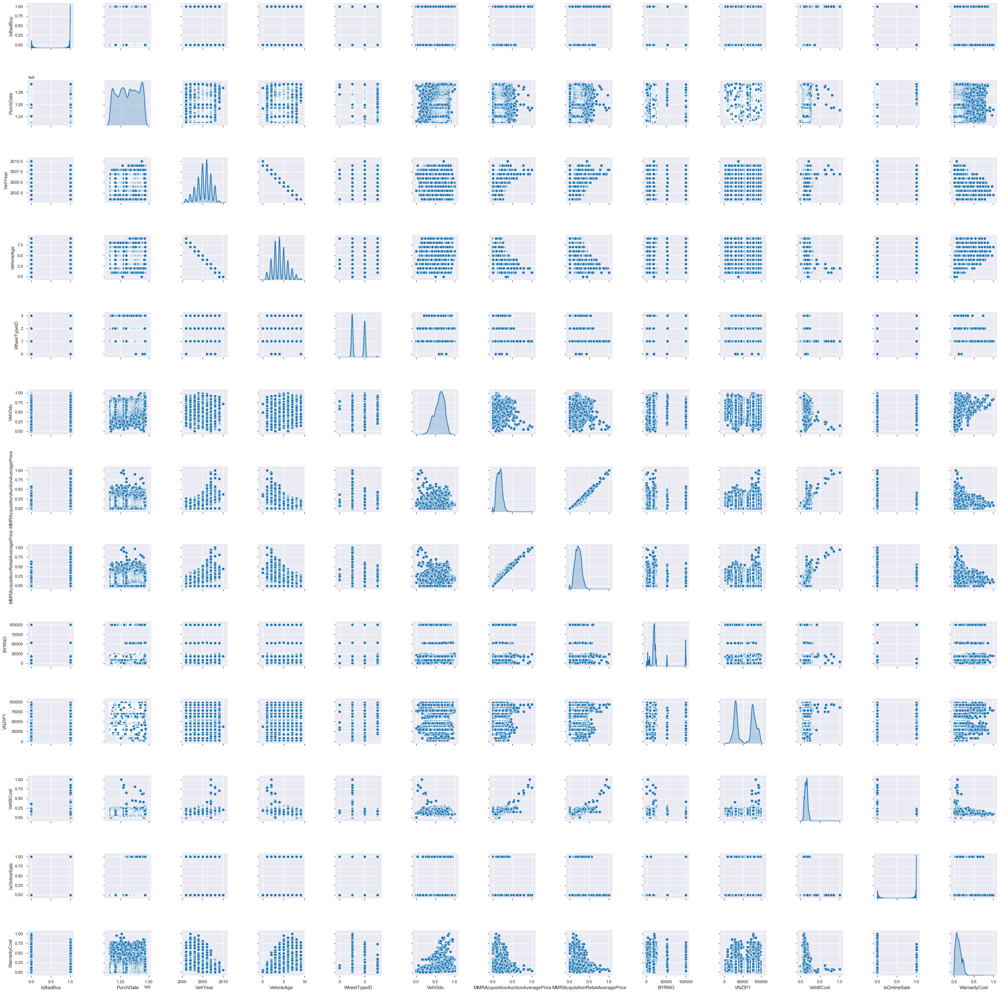

In [14]:
import seaborn as sns
cmap = sns.diverging_palette(220, 10, as_cmap=True) # one of the many color mappings
sns.pairplot(kick_imputed_scaled, diag_kind="kde")

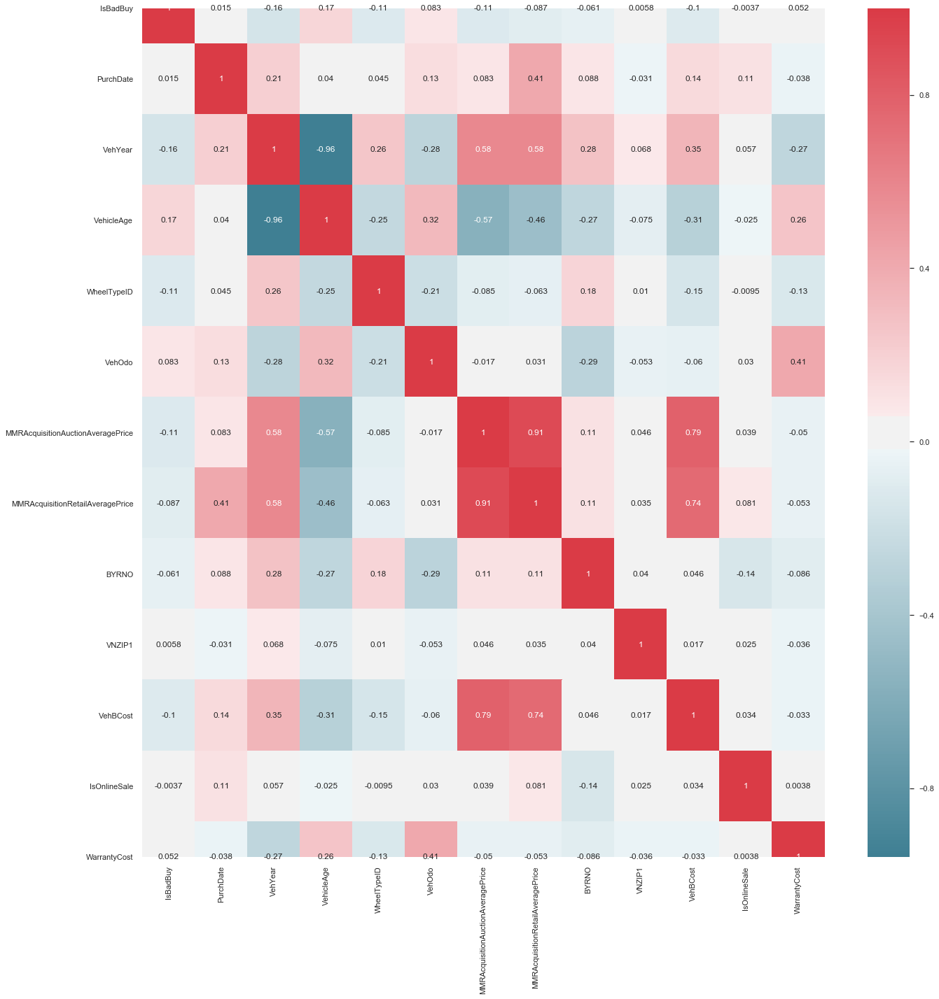

In [15]:
# plot the correlation matrix 
sns.set(style="whitegrid")

f, ax = plt.subplots(figsize=(20, 20))

sns.heatmap(kick_imputed_scaled.corr(), cmap=cmap, annot=True)

f.tight_layout()

(array([3.6496e+04, 2.5508e+04, 9.7090e+03, 6.5200e+02, 1.5200e+02,
        1.7500e+02, 1.4300e+02, 1.3700e+02, 7.0000e+00, 4.0000e+00]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

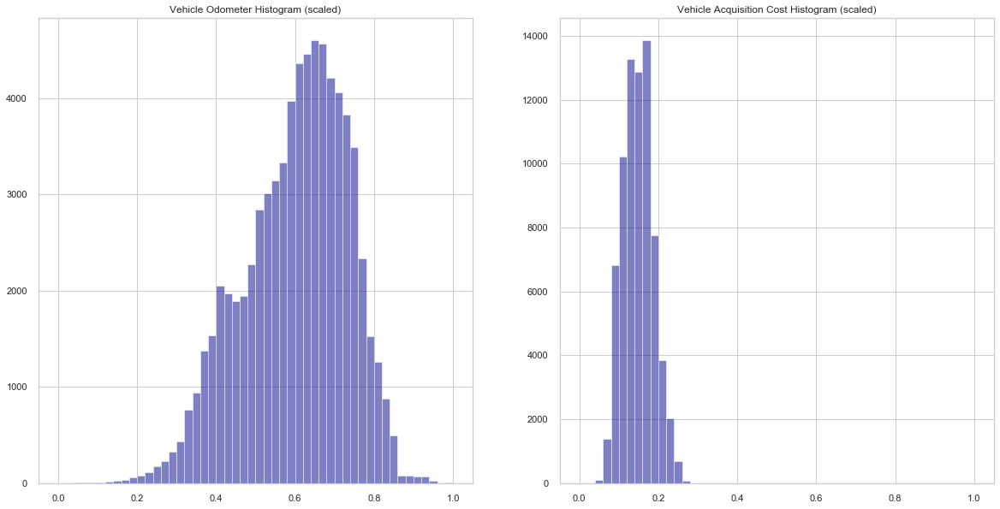

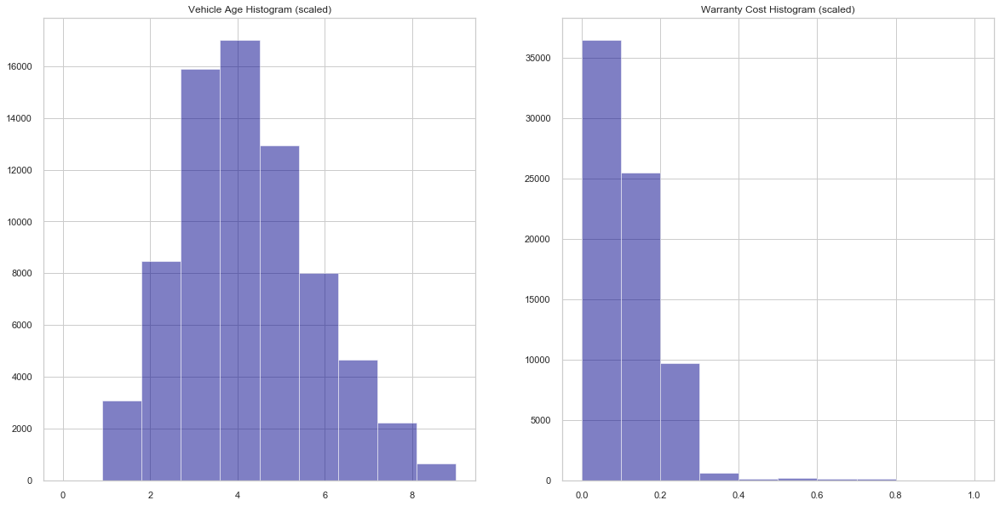

In [16]:
#lets create some histograms like a normal stats person

fig1 = plt.figure(figsize=(20,10))
fig2 = plt.figure(figsize=(20,10))

ax1 = fig1.add_subplot(1,2,1)
ax2 = fig1.add_subplot(1,2,2)

ax3 = fig2.add_subplot(1,2,1)
ax4 = fig2.add_subplot(1,2,2)

ax1.set_title("Vehicle Odometer Histogram (scaled)")
ax1.hist(kick_imputed_scaled['VehOdo'], bins = 50, color='darkblue', alpha = 0.5)

ax2.set_title("Vehicle Acquisition Cost Histogram (scaled)")
ax2.hist(kick_imputed_scaled['VehBCost'], bins = 50, color='darkblue', alpha = 0.5)

ax3.set_title("Vehicle Age Histogram (scaled)")
ax3.hist(kick_imputed_scaled['VehicleAge'], bins = 10, color='darkblue', alpha = 0.5)

ax4.set_title("Warranty Cost Histogram (scaled)")
ax4.hist(kick_imputed_scaled['WarrantyCost'], bins = 10, color='darkblue', alpha = 0.5)


### 1.3.5 Standardized and Clean Data Profiling

In [17]:
#Perform Final Profiling

kick_imputed_scaled.profile_report(style={'full_width':True})

## 1.4 Simple Statistics

In [18]:

detail_describe(kick_imputed_scaled).transpose()



,count,nullcounts,mean,std,min,median,max
IsBadBuy,72983,0,0.122988,0.328425,0,0,1
PurchDate,72983,0,1.26309e+09,1.8196e+07,1.23111e+09,1.26403e+09,1.29367e+09
Auction,72983,0,NaN,NaN,ADESA,NaN,OTHER
VehYear,72983,0,2005.34,1.73125,2001,2005,2010
VehicleAge,72983,0,4.17664,1.71221,0,4,9
Make,72983,0,NaN,NaN,ACURA,NaN,VOLVO
Model,72983,0,NaN,NaN,1500 RAM PICKUP 2WD,NaN,ZEPHYR 3.0L V6 SFI
Trim,72983,0,NaN,NaN,1,NaN,s
SubModel,72983,0,NaN,NaN,2D CONVERTIBLE,NaN,WAGON SXT AWD
Color,72983,0,NaN,NaN,BEIGE,NaN,YELLOW


### 1.4.1 Visualization

Buying a car from auctions benefit the buyer when the buyer has the most amount of information available to them. While most dealers understand that it’s important to price their used vehicles to the market is by understanding vehicle features that drives the market demand and pricing. 

We feel that the vehicle pricing is a leading indicator for determininig what percentage of vehicles are kicked vehicles. Therefor, we analyzed the dataset to explore attributes that are contributing factors for vehicle price. How it could help predict kick cars as well as help us gain credence on price optimization based on vehicle's exterior, interior, trim and engine specification. 

Based on initial visualization of key attributes we feel though further analysis is required, we were able to extract some interesting insights.


**Mileage, Make, Cost, Size and Auction type** that we focused to be most important attrributes. 

The average vehicle age is increasing year over year within the used car aucion industry, our dataset (**2000 - 2010**) average vehicle age is four years and for the vehicle population age range between one ~ ten years.

We are to confirm that auction prices (**MMRAcquisitionAuctionAveragePrice, MMRAcquisitionRetailAveragePrice, VehBCost**) decresed for older cars.  However, **WarrantyCost** were naturally higher for older cars. 

We also discovered majority of cars belong to top three american brand (**GM - 35%, Chrysler - 32% and Ford - 17%**) with various size cars majority are medium size (**42%**) followed by fullsize (Large) and medium SUV's (**12% & 11%**) respectively. With respect to the exterior color of the car we can confirm that **Black** has the highest cost and **Red** costs the most in warranty cost. 

However, top three colors in the dataset were Sliver (**20%**), White (**17%**) and Blue (**14%**).  Car price trend expectedly as 96% have automatic transmission and newer car has high auction prices and lower warranty cost. 

Surprisingly new cars  (**Age 0-1**) with covered wheels (**WheelType**) costs more compare to Alloy wheel which appears to be an outlier in the underlying trend where Alloy weels cost more. Similary Warranty cost **converges** for **yellow** color car with mannual transmission and Van costs more while **Large SUV** draw highest auction price.  
Interstingly Lexus, Cadillac and Infinit scored high price for bad buy (**IsBadBuy**) category, however we couldn't see any price differece in following make for the same category. 

1. GMC
2. Hyundai 
3. Toyota
4. Oldsmobile
5. Scion
6. Plymouth
7. Acura
9. Suzuki

Highest price car by their make & model:
1. Cadillac Escalade
2. Lexus GX470
3. Lexus RX400 AWD
4. Toyota Highlander V6
5. Volkswagon Toureg V8

Lowest price car by their make & model:
1. Buick Sabre
2. Chevrolet Silverado, Trailblazer, Suburban, Cavalier

We also discover convergence of price in manual transmission which surpass automatic transmission in 2008 models.



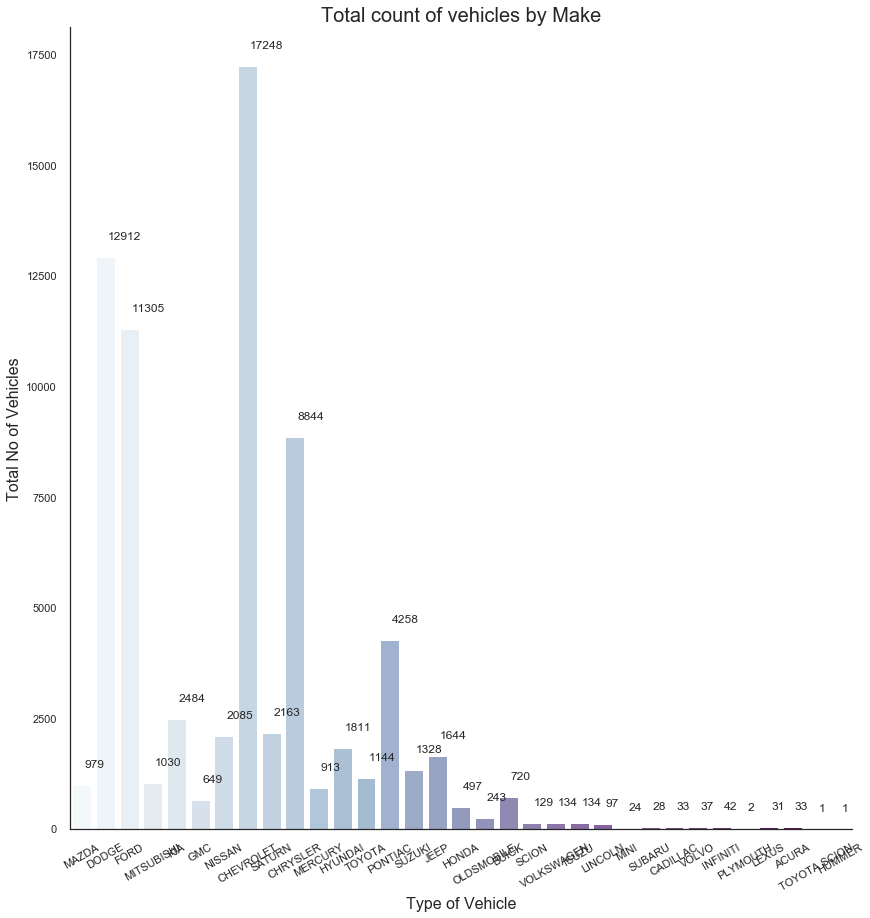

In [20]:
# Count plot to show the number of vehicles  by each Make
sns.set_style("white")
g = sns.factorplot(x="Make", data=kick_imputed_scaled, kind="count",
                   palette="BuPu", size=12, aspect=1)
g.ax.xaxis.set_label_text("Type of Vehicle",fontdict= {'size':16})
g.ax.yaxis.set_label_text("Total No of Vehicles", fontdict= {'size':16})
g.ax.set_title("Total count of vehicles by Make",fontdict= {'size':20})
g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=30)
# to get the counts on the top heads of the bar
for p in g.ax.patches:
    g.ax.annotate((p.get_height()), (p.get_x()+0.5, p.get_height()+400))

### 1.5 - Visualize Attributes
   

### 1.5.1 Vehicle Cost Vs. Color

[Text(0, 0, 'RED'),
 Text(0, 0, 'WHITE'),
 Text(0, 0, 'MAROON'),
 Text(0, 0, 'SILVER'),
 Text(0, 0, 'BLACK'),
 Text(0, 0, 'GOLD'),
 Text(0, 0, 'GREY'),
 Text(0, 0, 'BLUE'),
 Text(0, 0, 'BEIGE'),
 Text(0, 0, 'PURPLE'),
 Text(0, 0, 'ORANGE'),
 Text(0, 0, 'GREEN'),
 Text(0, 0, 'BROWN'),
 Text(0, 0, 'YELLOW'),
 Text(0, 0, 'NOT AVAIL'),
 Text(0, 0, 'OTHER'),
 Text(0, 0, 'UNKNOWN')]

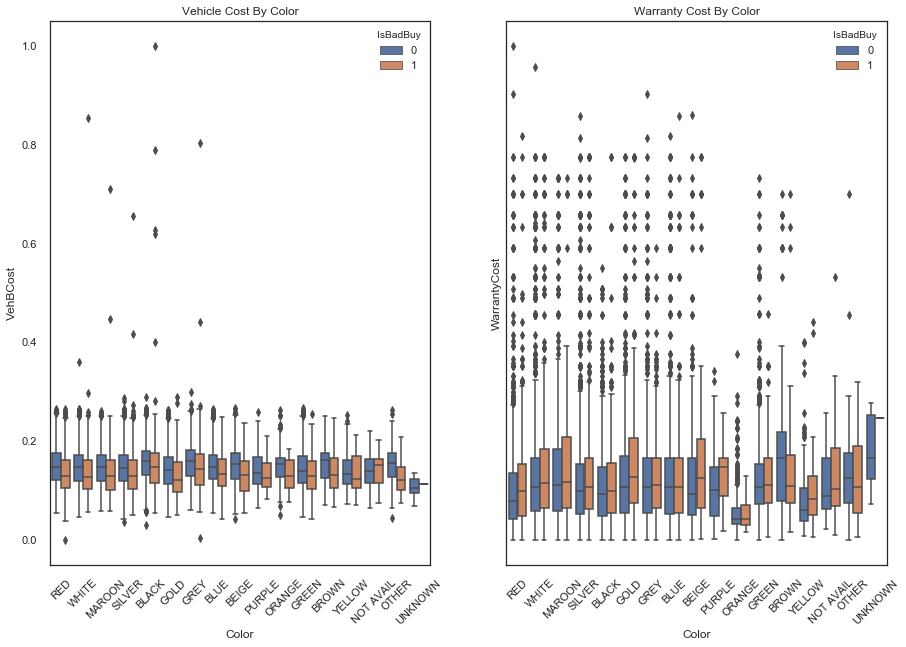

In [21]:
plt.rcParams['figure.figsize']=(15,45)
f, axes = plt.subplots(1, 2, sharey=True, figsize=(15, 10))
a=sns.boxplot(data=kick_imputed_scaled, x="Color", y="VehBCost", hue="IsBadBuy", ax=axes[0])
b=sns.boxplot(data=kick_imputed_scaled, x="Color", y="WarrantyCost", hue="IsBadBuy", ax=axes[1])
a.set_title("Vehicle Cost By Color")
b.set_title("Warranty Cost By Color")
a.set_xticklabels(a.get_xticklabels(), rotation=45)
b.set_xticklabels(b.get_xticklabels(), rotation=45)



   ### 1.5.2 Interesting Trends

In [22]:
import matplotlib as plt
import seaborn as sns

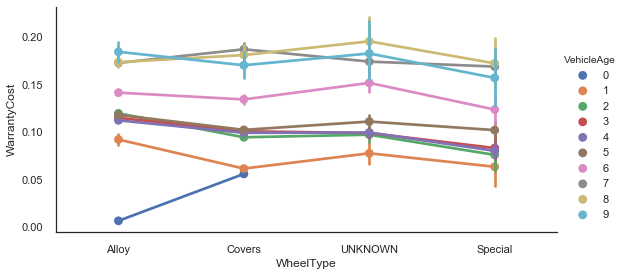

In [23]:


plt.rcParams['figure.figsize']=(25,15)
#ax = sns.catplot(data=kick_imputed_scaled, x="WheelType", y="MMRAcquisitionAuctionAveragePrice", hue="VehicleAge" ,kind="point")
#ax = sns.catplot(data=kick_imputed_scaled, x="WheelType", y="MMRAcquisitionRetailAveragePrice", hue="VehicleAge" ,kind="point")
#ax = sns.catplot(data=kick_imputed_scaled, x="WheelType", y="VehBCost", hue="VehicleAge" ,kind="point")
ax = sns.catplot(data=kick_imputed_scaled, x="WheelType", y="WarrantyCost", 
                 hue="VehicleAge" ,kind="point", height=4, aspect=2)

   ### 1.5.3 Warranty Cost Conversion 

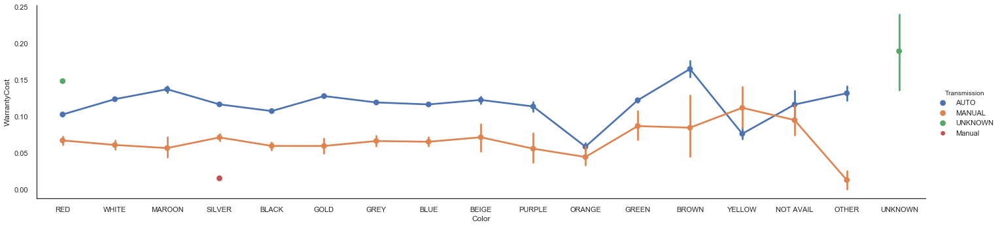

In [24]:
# Price variation by Color group by Transmission
#ay = sns.catplot(data=kick_imputed_scaled, x="Color", y="MMRAcquisitionAuctionAveragePrice", hue="Transmission" ,kind="point", height=5, aspect=4)
#ax = sns.catplot(data=kick_imputed_scaled, x="Color", y="MMRAcquisitionRetailAveragePrice", hue="Transmission" ,kind="point", height=5, aspect=4)
#az = sns.catplot(data=kick_imputed_scaled, x="Color", y="VehBCost", hue="Transmission" ,kind="point", height=5, aspect=4)
aa = sns.catplot(data=kick_imputed_scaled, x="Color", y="WarrantyCost", hue="Transmission" ,kind="point", height=5, aspect=4)

   ### 1.5.4 Bad Buy Vs Good Buy - No price difference

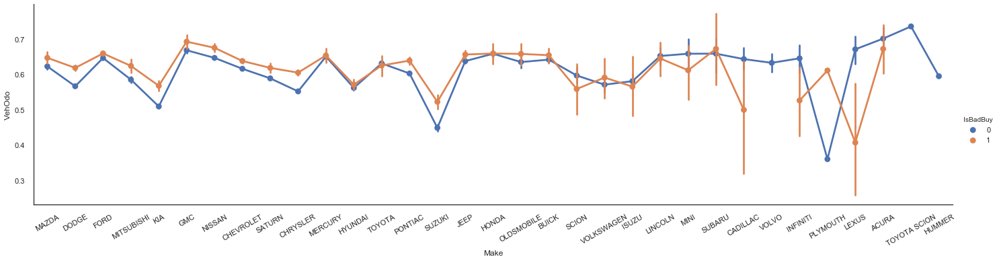

In [25]:
# Mileage variation by Vehicle Make group by BadBuy
ax = sns.catplot(data=kick_imputed_scaled, x="Make", y="VehOdo", hue="IsBadBuy" ,kind="point", 
                 height=5, aspect=4)
ax.set_xticklabels(rotation=30)

   ### 1.5.5 Top 5 Highest value cars

In [26]:
#top 5 highest price auction car and their models details
kick_imputed_scaled[kick_imputed_scaled.MMRAcquisitionAuctionAveragePrice.isin(kick_imputed_scaled.MMRAcquisitionAuctionAveragePrice.nlargest())].sort_values(
    ['Make','VehYear','VehOdo','Size','IsBadBuy'])

,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,Color,...,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionRetailAveragePrice,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
48207,1,1250640000,OTHER,2007,2,CADILLAC,ESCALADE 2WD,Bas,4D SUV 6.2L LUXURY,BLACK,...,LARGE SUV,GM,0.939001,0.939765,3582,85260,AZ,1.000000,0,0.076606
61750,1,1255046400,ADESA,2007,2,LEXUS,GX470 4WD,UNKNOWN,4D SPORT UTILITY,WHITE,...,SPECIALTY,OTHER,0.902805,0.904043,16926,91752,CA,0.852996,0,0.068078
15308,1,1274832000,MANHEIM,2008,2,LEXUS,RX400H AWD,UNKNOWN,4D SPORT UTILITY,GREY,...,MEDIUM SUV,OTHER,0.897570,0.969422,835,94544,CA,0.802410,0,0.076606
22276,1,1254268800,MANHEIM,2008,1,TOYOTA,HIGHLANDER 4WD V6,Lim,4D SPORT UTILITY HYBRID LIMITED,BLACK,...,MEDIUM SUV,OTHER,1.000000,1.000000,23359,92807,CA,0.789544,0,0.034110
38391,1,1288137600,MANHEIM,2008,2,VOLKSWAGEN,TOUAREG V8,UNKNOWN,4D SPORT UTILITY 4XMOTION,BLACK,...,MEDIUM SUV,OTHER,0.793741,0.772671,20833,75236,TX,0.619755,0,0.175099


   ### 1.5.6 Top 5 Lowest value cars

In [27]:
#top 5 lowest price auction car and their models details
kick_imputed_scaled[kick_imputed_scaled.MMRAcquisitionAuctionAveragePrice.isin(kick_imputed_scaled.MMRAcquisitionAuctionAveragePrice.nsmallest())].sort_values(
    ['Make','VehYear','VehOdo','Size','IsBadBuy'])

,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,Color,...,Size,TopThreeAmericanName,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionRetailAveragePrice,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
54143,1,1289952000,MANHEIM,2005,5,BUICK,LE SABRE,Cus,4D SEDAN CUSTOM,GREEN,...,LARGE,GM,0.0,0.0,18881,37122,TN,0.139087,0,0.248152
4921,0,1243296000,MANHEIM,2002,7,CHEVROLET,2500HD SILVERADO PIC,LS,EXT CAB 8.1L LS,GREY,...,LARGE TRUCK,GM,0.0,0.0,835,85040,AZ,0.182304,0,0.121944
40425,1,1284595200,MANHEIM,2002,8,CHEVROLET,TRAILBLAZER 2WD 6C,LS,4D SUV 4.2L LS,BLACK,...,MEDIUM SUV,GM,0.0,0.0,8655,76040,TX,0.143486,0,0.153638
23157,1,1269475200,MANHEIM,2002,8,CHEVROLET,SUBURBAN 1500 4WD,150,4D UTILITY 5.3L FFV LS,BLUE,...,LARGE SUV,GM,0.0,0.0,18111,29532,SC,0.197260,0,0.249574
25242,0,1268870400,OTHER,2003,7,CHEVROLET,CAVALIER 4C,LS,4D SEDAN LS,SILVER,...,COMPACT,GM,0.0,0.0,3453,80229,CO,0.089382,0,0.167567
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48568,0,1268956800,MANHEIM,2006,4,TOYOTA,CAMRY 4C,Bas,4D SEDAN,BLUE,...,MEDIUM,OTHER,0.0,0.0,19619,17545,PA,0.214964,0,0.006111
37767,0,1268870400,MANHEIM,2007,3,TOYOTA,COROLLA,CE,4D SEDAN CE,BLACK,...,COMPACT,OTHER,0.0,0.0,22916,89120,NV,0.164599,0,0.002843
37770,0,1268870400,MANHEIM,2008,2,TOYOTA,YARIS,Bas,4D SEDAN,WHITE,...,COMPACT,OTHER,0.0,0.0,22916,89120,NV,0.198359,0,0.002843
31017,0,1268956800,OTHER,2008,2,TOYOTA,CAMRY 4C,CE,4D SEDAN CE,WHITE,...,MEDIUM,OTHER,0.0,0.0,99761,85284,AZ,0.222112,0,0.018761


### 1.5.7 Manual Transmission price conversion in 2008 models.

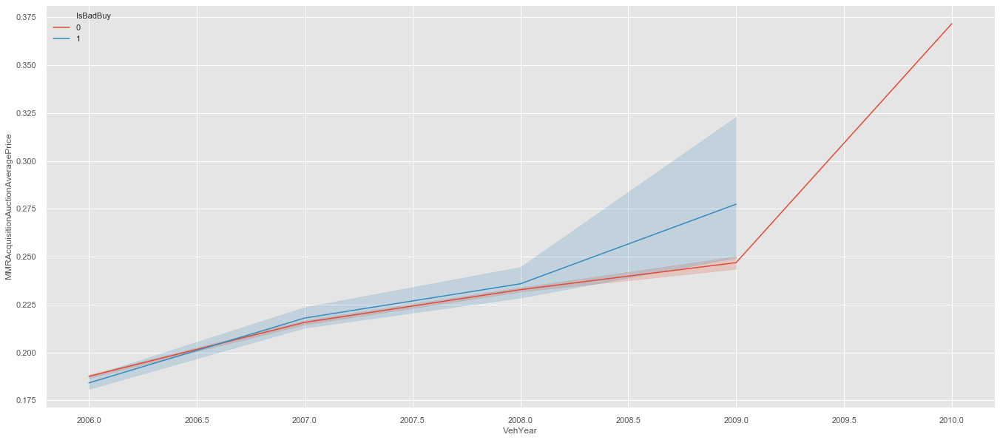

In [47]:
sns.lineplot(data=kick_imputed_scaled[kick_imputed_scaled.VehYear >= 2006], y='MMRAcquisitionAuctionAveragePrice', x='VehYear', hue='IsBadBuy')
#plt.title("Current Average Auction Price by Year >=2006")

## Why Manual Transmission price surpass Auto in 2008 models?

## 1.6 & 1.7 Exploring Attributes and Class


The following section explores the relationships between attributes via scatterplot matrix, correlation, cross tabulation and group wise averages.

In this section we explore the relationships between feature classification groups and the “Kick” rate target classification that are trying to predict. Each Feature group represents a set of attributes that share common traits and/or behavior characteristics as it relates to the Vehicle Kick Rate. We use to group definitions to help focus our analysis on identifying what factors affect the kick rate .

PRODUCT RELATED Feature Groups Product Type Classification • Manufacturer Brand • Car Model • Car SubModel • Car Model Year

Physical Product Attributes • Size • Color • Transmission • Type of Wheel • Trim

Product Quality Attributes • Product Use • Product Age

Economic Related Feature Groups: Purchase Transaction Valuation Attributes • Product Supplier • Transaction Date • Location State • Location Zip Code

Purchase Transaction Event Related Attributes • Product Acquisition Cost • Premium/Discount Amt • Purchase Type (Prem./Disc.)



In [30]:
# the percentage of Car purchases that were Kicked
len(kick_imputed[kick_imputed.IsBadBuy==1])/len(kick_imputed)*100.0


12.298754504473644

In [31]:
# Kick Rate by Make and Vehicle Year
kick_imputed_grouped = kick_imputed.groupby(by=['Make','VehYear'])
print ("Kick Rate Broken down by Make and Year:")
print (kick_imputed_grouped.IsBadBuy.sum() / kick_imputed_grouped.IsBadBuy.count() *100)

Kick Rate Broken down by Make and Year:
Make        VehYear
ACURA       2001       33.333333
            2002       14.285714
            2003       40.000000
            2004        0.000000
            2005       25.000000
                         ...    
VOLKSWAGEN  2008       50.000000
VOLVO       2005        0.000000
            2006        0.000000
            2007        0.000000
            2008        0.000000
Name: IsBadBuy, Length: 238, dtype: float64


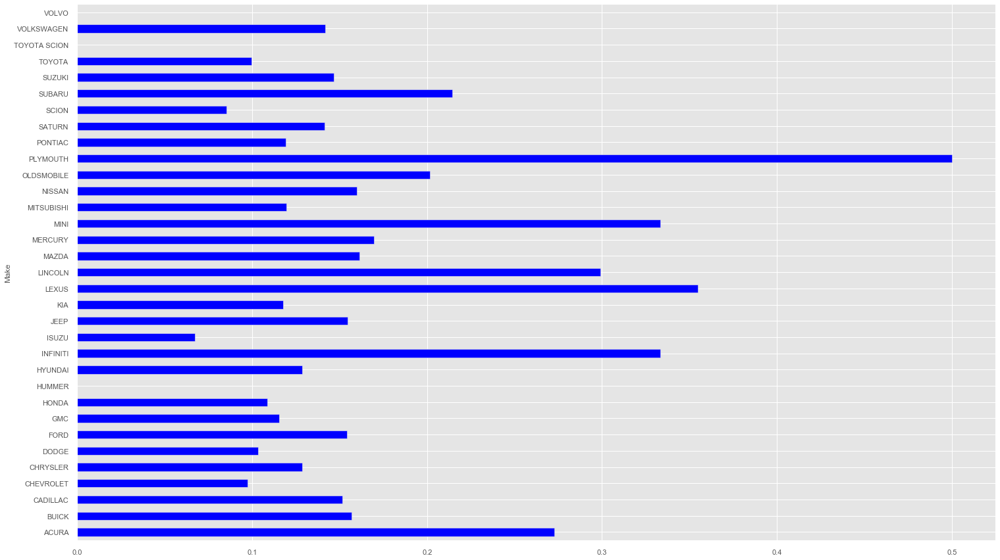

In [33]:
# Lets plot the Kick Rate for Car Make and Year Separately
# Kick Rate by Make
plt.style.use('ggplot')
kick_imputed_grouped = kick_imputed.groupby(by=['Make'])
kicked_rate = kick_imputed_grouped.IsBadBuy.sum() / kick_imputed_grouped.IsBadBuy.count()
ax = kicked_rate.plot(kind='barh', color=["blue"])
#plt.title("Vehicle Kick Rate for Selected Vehicle Manufacturers Make", fontsize=20)

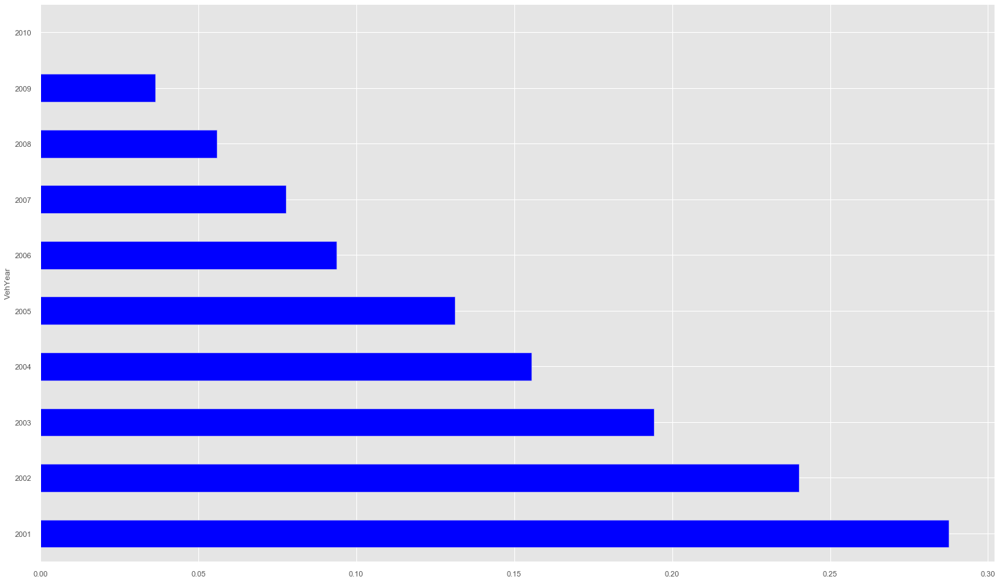

In [34]:
# Kick Rate by Year
plt.style.use('ggplot')
kick_imputed_grouped = kick_imputed.groupby(by=['VehYear'])
kicked_rate = kick_imputed_grouped.IsBadBuy.sum() / kick_imputed_grouped.IsBadBuy.count()

ax = kicked_rate.plot(kind='barh', color=["blue"])
#plt.title("Vehicle Kick Rate for Selected Vehicle Years", fontsize=20)

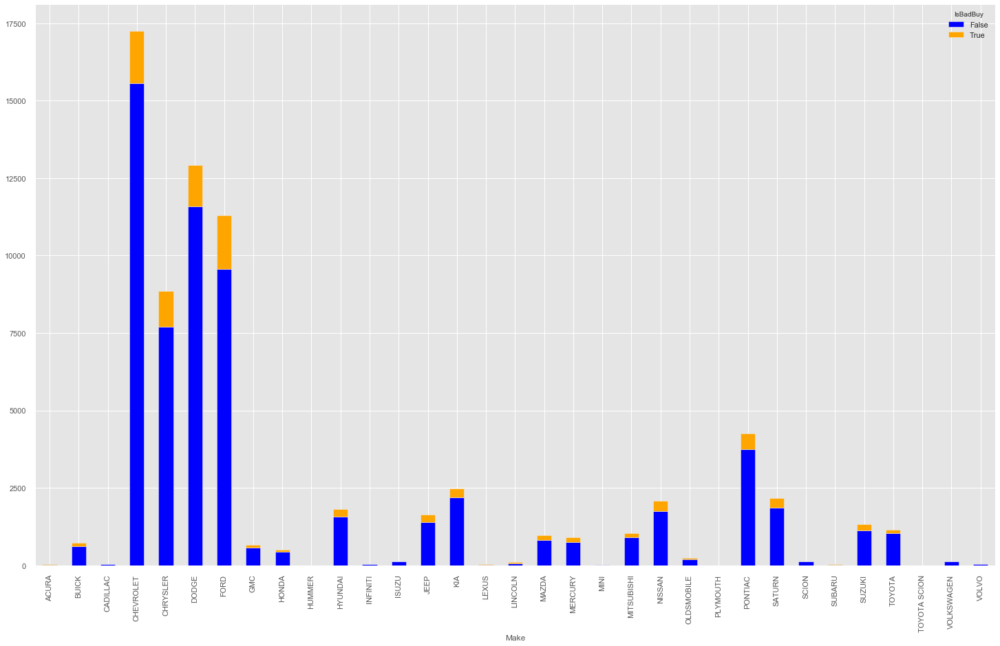

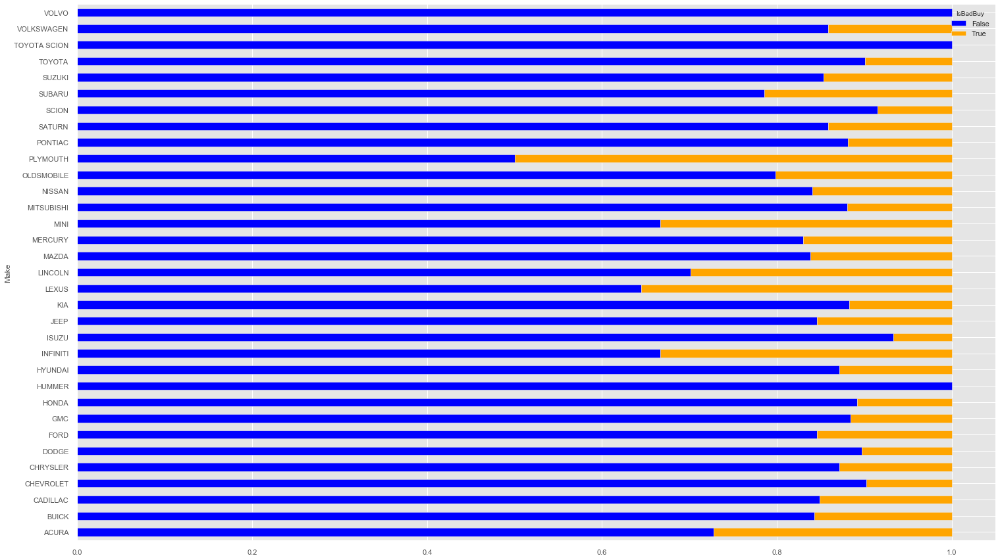

In [36]:
# cross tabulate Car Purchase Volume for Good Vs. Bad Buys broken down by Car Make
# Vehicle Kick Rate for Selected Color Categories

kick_counts = pd.crosstab([kick_imputed['Make']], 
                              kick_imputed.IsBadBuy.astype(bool))
kick_counts.plot(kind='bar', 
                     stacked=True, color=['blue','orange'])
#plt.title("Vehicle Kick Rate for Selected Vehicle Manufacturers Make", fontsize=20)
# divide the counts to get rates
kick_rate = kick_counts.div(kick_counts.sum(1).astype(float),axis=0)
kick_rate.plot(kind='barh', 
                   stacked=True, color=['blue','orange'])
#plt.title("Normalized Kick Rate for Selected Vehicle Manufacturers Make", fontsize=20)

Based on initial review, we do not see any trends to suggest that a manufacturer’s make, model, and year are major predictors of determining the kick value. 
While we that  are able identify a few anomalies that relate to a specific manufacturer’s make.  

From the graph above you can see that Acura, Lexus, Infiniti, and Plymouth to have a kick rate greater than 25%. However, upon further review of the cross tabulation table we can attribute the large kick rate to the small sample size.  Interestingly enough, with the exclusion of Lexus, all other models were discontinued.  

# Product Quality Review


Depreciation is the rate at which a vehicle loses its value over time. The drop in value varies between makes and models but typically is between 15-35% in the first year and up to 50% or more over three years.  

There are lots of factors involved in a car’s depreciation, with the biggest being its age and mileage.  Both factors can used to determine a car’s wear and tear (i.e. how much the product has been used over the life of the asset). The more miles on a car, the more wear and tear it has accumulated, therefore the less it’s worth.

The chart above illustrates the strong relationship that exists between Mileage and Vehicle Age. We can see that for the first 3 years before reaching the 3 year mark when the good vs. bad buys switched positions, indicating a higher rate of kicked vehicles as vehicles continue to age.


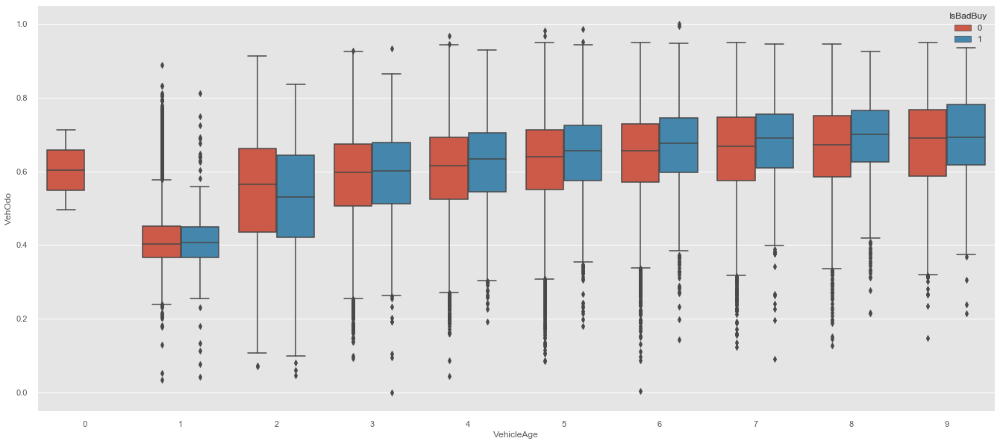

In [37]:
#Whether product quality impacts Kick Rate across the different product types
# Avg. Mileage Price Broken out by VehicleAge
plt.rcParams['figure.figsize']=(23,10)
ax = sns.boxplot(x="VehicleAge", y="VehOdo", hue="IsBadBuy", data=kick_imputed)
#plt.title("Average Vehicle Mileage by Vehicle Age", fontsize=20)

# Product Feature Review

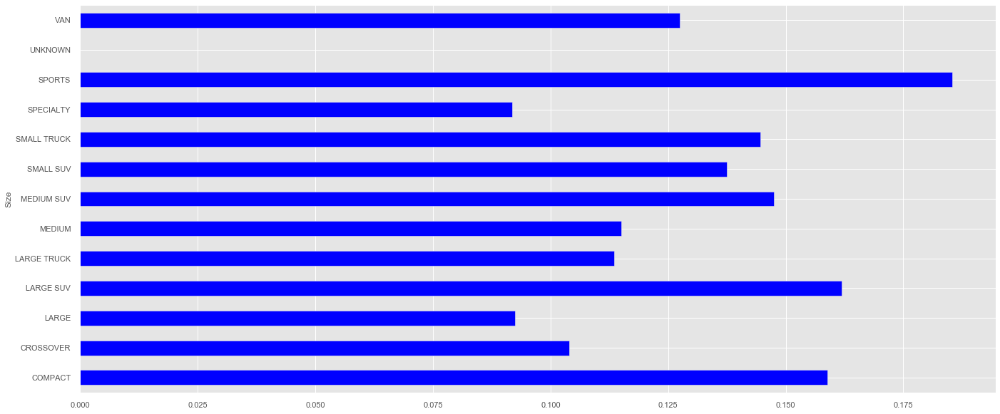

In [38]:
# Product Feature Kick Rate
# Kick Rate by Size
plt.style.use('ggplot')
kick_imputed_grouped = kick_imputed.groupby(by=['Size'])
kicked_rate = kick_imputed_grouped.IsBadBuy.sum() / kick_imputed_grouped.IsBadBuy.count()
ax = kicked_rate.plot(kind='barh', color=["blue"])
#plt.title("Vehicle Kick Rate by Vehicle Size", fontsize=20)

[Text(0, 0, 'MAZDA'),
 Text(1, 0, 'DODGE'),
 Text(2, 0, 'FORD'),
 Text(3, 0, 'MITSUBISHI'),
 Text(4, 0, 'KIA'),
 Text(5, 0, 'GMC'),
 Text(6, 0, 'NISSAN'),
 Text(7, 0, 'CHEVROLET'),
 Text(8, 0, 'SATURN'),
 Text(9, 0, 'CHRYSLER'),
 Text(10, 0, 'MERCURY'),
 Text(11, 0, 'HYUNDAI'),
 Text(12, 0, 'TOYOTA'),
 Text(13, 0, 'PONTIAC'),
 Text(14, 0, 'SUZUKI'),
 Text(15, 0, 'JEEP'),
 Text(16, 0, 'HONDA'),
 Text(17, 0, 'OLDSMOBILE'),
 Text(18, 0, 'BUICK'),
 Text(19, 0, 'SCION'),
 Text(20, 0, 'VOLKSWAGEN'),
 Text(21, 0, 'ISUZU'),
 Text(22, 0, 'LINCOLN'),
 Text(23, 0, 'MINI'),
 Text(24, 0, 'SUBARU'),
 Text(25, 0, 'CADILLAC'),
 Text(26, 0, 'VOLVO'),
 Text(27, 0, 'INFINITI'),
 Text(28, 0, 'PLYMOUTH'),
 Text(29, 0, 'LEXUS'),
 Text(30, 0, 'ACURA'),
 Text(31, 0, 'TOYOTA SCION'),
 Text(32, 0, 'HUMMER')]

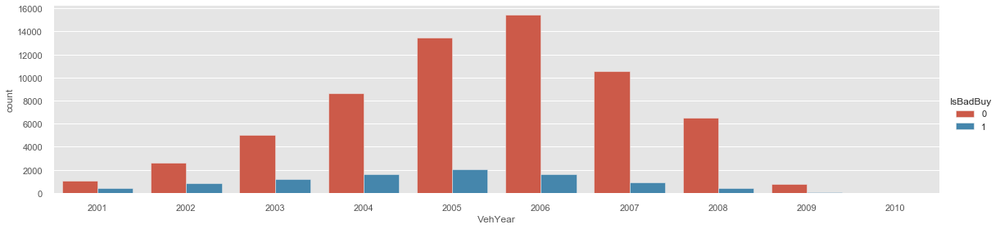

In [39]:
# Number of Vehicles Purchased at Auction for Selected Model Years
sns.catplot(x="VehYear", hue="IsBadBuy", kind="count", data=kick_imputed,  height=4, aspect=4)


g.ax.xaxis.set_label_text("Vehicle Model Year",fontdict= {'size':16})
g.ax.yaxis.set_label_text("Total No of Vehicles", fontdict= {'size':16})
g.ax.set_title("Number of Vehicles Purchased at Auction for Selected Model Years",fontdict= {'size':20})
g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=30)

Text(0.5, 1, 'Number of Vehicles Purchased at Auction for Selected Color Categories')

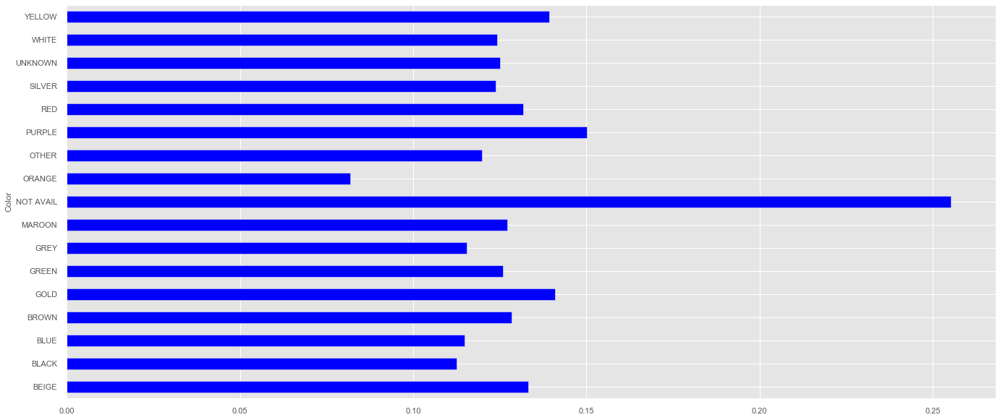

In [41]:
# Vehicle Kick Rate for Selected Color Categories
plt.style.use('ggplot')
kick_imputed_grouped = kick_imputed.groupby(by=['Color'])
kicked_rate = kick_imputed_grouped.IsBadBuy.sum() / kick_imputed_grouped.IsBadBuy.count()
ax = kicked_rate.plot(kind='barh', color=["blue"])

#plt.xlabel("Color of Vehicle")
#plt.ylabel("Total No of Vehicles")
#plt.title("Vehicle Kick Rate for Selected Color Categories")

#g.ax.xaxis.set_label_text("Color of Vehicle",fontdict= {'size':16})
#g.ax.yaxis.set_label_text("Total No of Vehicles", fontdict= {'size':16})
#g.ax.set_title("Number of Vehicles Purchased at Auction for Selected Color Categoriesg.ax.xaxis.set_label_text("Color of Vehicle",fontdict= {'size':16})
g.ax.yaxis.set_label_text("Total No of Vehicles", fontdict= {'size':16})
g.ax.set_title("Number of Vehicles Purchased at Auction for Selected Color Categories",fontdict= {'size':20})

Text(0.5, 1, 'Number of Vehicles Purchased at Auction for Selected Color Categories')

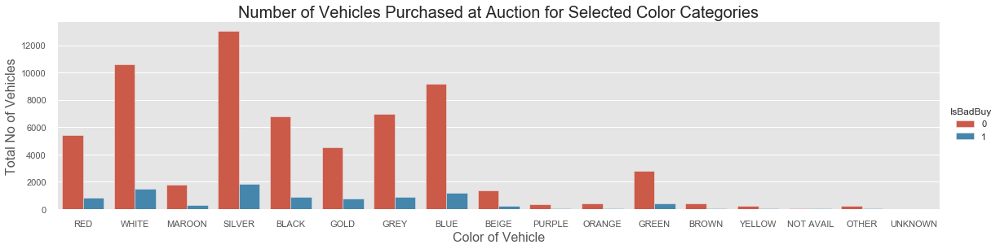

In [42]:
# Distribution of Vehicles Purchased by Color Selectiom
g= sns.catplot(x="Color", hue="IsBadBuy", kind="count", data=kick_imputed, height=4, aspect=4);

g.ax.xaxis.set_label_text("Color of Vehicle",fontdict= {'size':16})
g.ax.yaxis.set_label_text("Total No of Vehicles", fontdict= {'size':16})
g.ax.set_title("Number of Vehicles Purchased at Auction for Selected Color Categories",fontdict= {'size':20})



Text(0.5, 1, 'Number of Vehicles Purchased at Auction by Transmission Type')

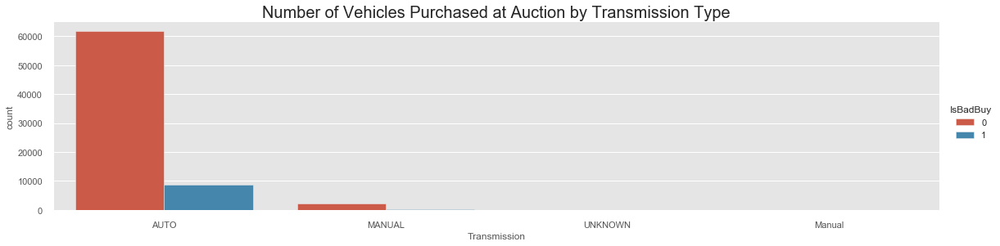

In [43]:
# Good Vs. Bad Car Buys broken down by Transmission
g= sns.catplot(x="Transmission", hue="IsBadBuy", kind="count", data=kick_imputed,  height=4, aspect=4);
#g.ax.xaxis.set_label_text("Color of Vehicle",fontdict= {'size':16})
#g.ax.yaxis.set_label_text("Total No of Vehicles", fontdict= {'size':16})
g.ax.set_title("Number of Vehicles Purchased at Auction by Transmission Type",fontdict= {'size':20})



# Product Valuation Assessement- Kick Value Price Sensitivity

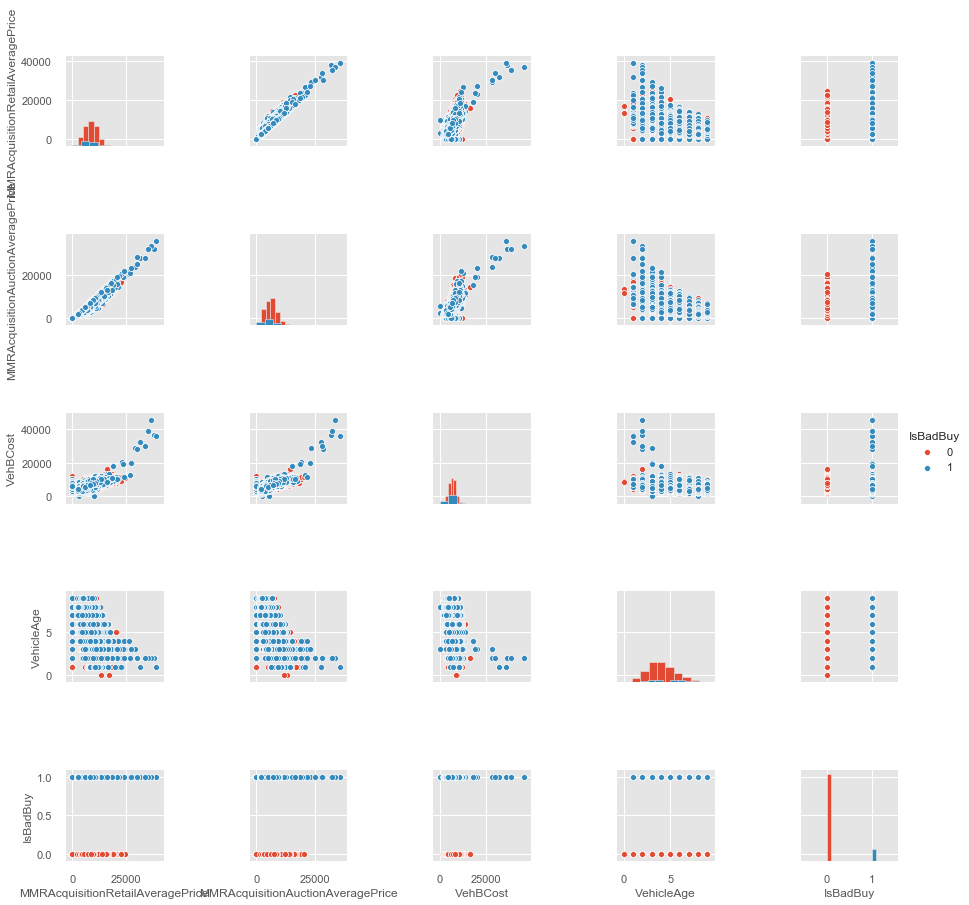

In [44]:

#Product Valuation Assessement- Kick Value Price Sensitivity
# Pair grouping plots segmented by good vs. bad buys
g= sns.pairplot(kick_data[["MMRAcquisitionRetailAveragePrice","MMRAcquisitionAuctionAveragePrice", "VehBCost", "VehicleAge","IsBadBuy"]],
                 hue="IsBadBuy", diag_kind="hist")

# Trends related to purchase transaction events

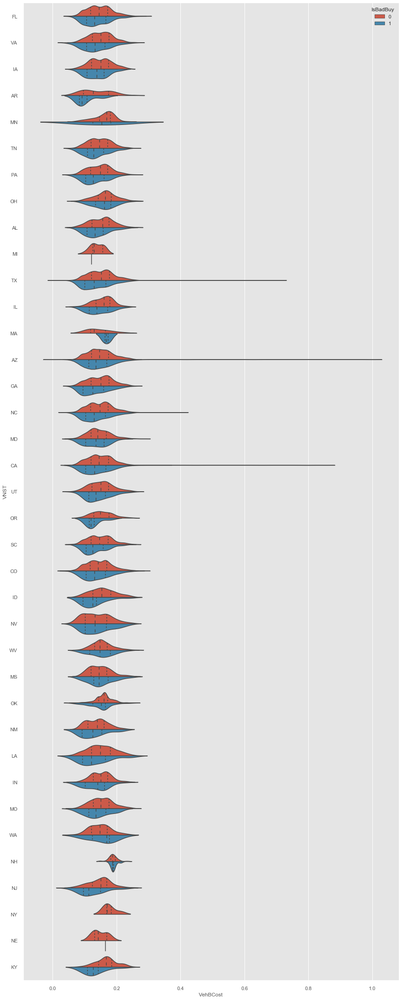

In [51]:
# Violin Plots illustrating Car Purchase Transactions broken down by State
from matplotlib import pyplot as plt
f, ax = plt.subplots(figsize=(15, 40))

sns.violinplot(x="VehBCost", y="VNST", hue="IsBadBuy", data=kick_imputed, 
               split=True, inner="quart", orient='h')


Text(0.5, 1, 'Number of Vehicles Purchased at Auction for Selected Color Categories')

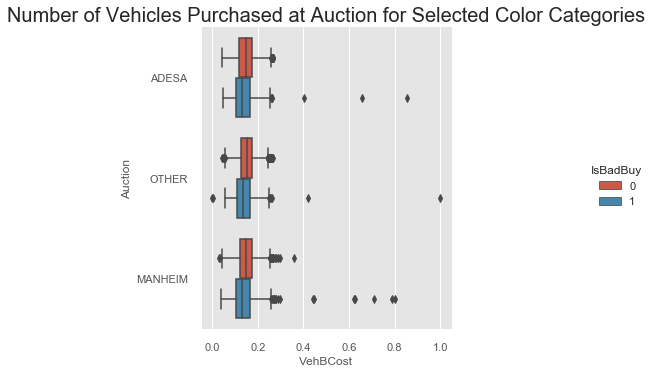

In [53]:
# Car Purchase Cost broken down by Product Supplier
plt.rcParams['figure.figsize']=(23,10)
g=sns.catplot(x="VehBCost", y="Auction", hue="IsBadBuy", kind="box", data=kick_imputed);
g.ax.set_title("Number of Vehicles Purchased at Auction for Selected Color Categories",fontdict= {'size':20})

## 1.8 New Features

In this section, we will create new features that can add value in predicting a kick car or determining the selling price for a used vehicle purchased at auction.  We will examine a list of features that can be created from the existing data set, new features that can be added from outside data, and a list of add-ons that we would request from Carvana, the owners of this datset if were employed by them to perform this analysis.        


### 1.8.1 Features that can be created from the existing dataset

 - Luxury or Standard vehicle
 
One of the topics discussed regarding kicks were the potential issues an owner faces as a car ages.  Luxury features in a car can be a strong selling tool but they also present costly repairs to the dealership when purchasing from an auction which does not allow for proper vetting of the vehicle. More high tech features and technology can offer a larger range of problems. We researched J.D. Powers, US News and World Report ( https://cars.usnews.com/cars-trucks/best-cars-blog/2016/09/whats-makes-a-luxury-car  and JD Powers (https://www.jdpower.com/cars/luxury-cars/10-most-popular-luxury-cars) to determine see if any of our car "Makes" were identified on the luxury list.   We found "Lexus", "Cadillac", "Lincoln" and "Infiniti" from our dataset were identified as luxury automakers.  
          
A new field called "Luxury" was created with an ordinal value of 1 or 0 if the Make was one of the above automakers.  We were interested in noting if there was a difference in the kick percentages for that group of cars compared to the standard cars.  

Text(0.5, 1.0, 'Luxury and Standard Vehichles by Buy Type')

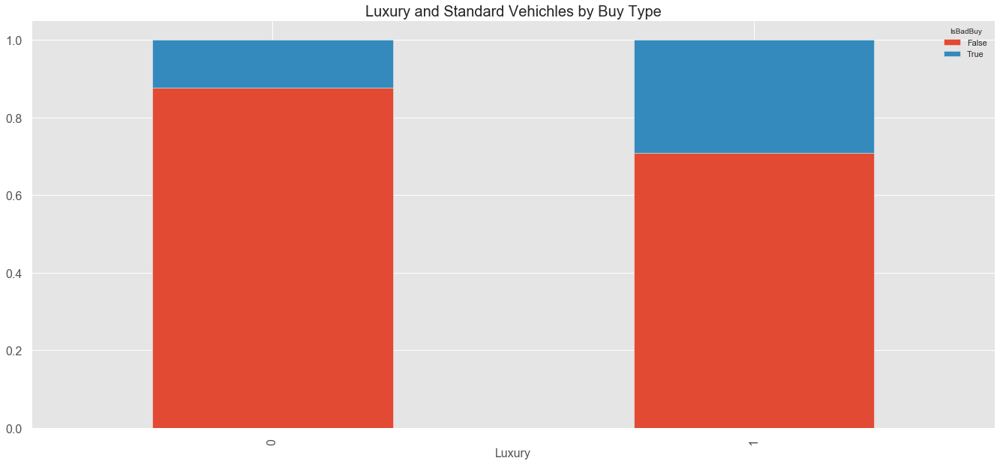

In [54]:
#Compare the Make field against the list of previously identified luxury automakers in this dataset.    
kick_imputed_scaled.columns = kick_imputed_scaled.columns.str.replace(' ', '')
temp=kick_imputed_scaled.Make.fillna("0")
kick_imputed_scaled['Luxury'] = pd.np.where(temp.str.contains("LEXUS"),1,
                   pd.np.where(temp.str.contains("CADILLAC"), 1,
                   pd.np.where(temp.str.contains("LINCOLN"), 1, 
                   pd.np.where(temp.str.contains("INFINITI"), 1, 0))))   
 
#Create a crosstab report of the Luxury field and the IsBadBuy (kick identifier) field.  
luxuryVal_count = pd.crosstab([kick_imputed_scaled['Luxury']], kick_imputed_scaled.IsBadBuy.astype(bool))

#Plot the results
plt.rcParams["axes.labelsize"] = 16
plt.rcParams["xtick.labelsize"]= 16
plt.rcParams["ytick.labelsize"]= 16
bars = ('Standard', 'Luxury')

kick_rate_by_luxury = luxuryVal_count.div(luxuryVal_count.sum(1).astype(float),axis=0)
kick_rate_by_luxury.plot(kind='bar', stacked=True)
plt.title("Luxury and Standard Vehichles by Buy Type", fontsize=20)

From the graph above you can see that about 30% of the Luxury vehicles are kicks as compared to the standard vehicles.  

 - Vehicle Axles 
 
Vehicle Axles was not specified as a separate field in the dataset.   We created this field from the existing Model field.  
We wanted to see if the axle type reveled any interesting information in this dataset.   The Axle type could be  4WD, FWD, 2WD, AWD.  

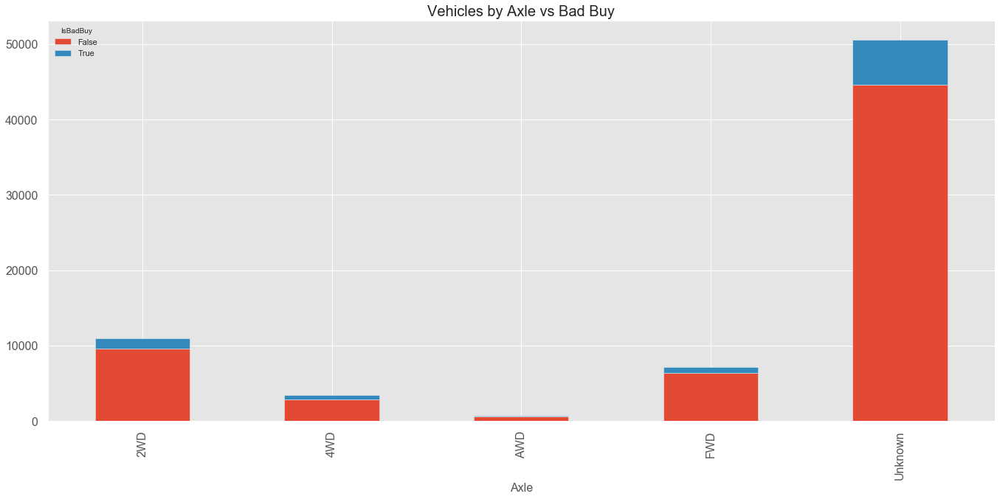

Text(0.5, 1.0, 'Percent of Bad Buy by Axle Type')

<Figure size 576x576 with 0 Axes>

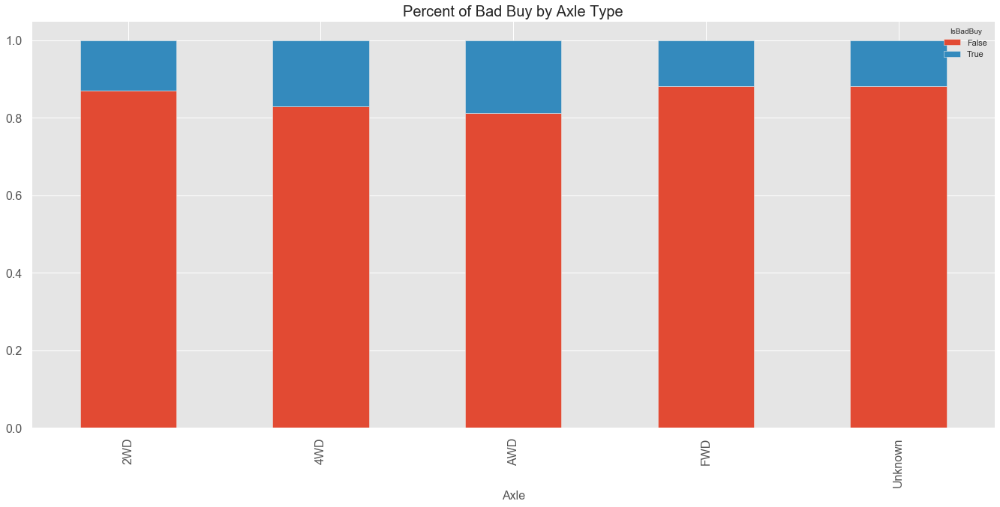

In [55]:
plt.rcParams["axes.labelsize"] = 16
plt.rcParams["xtick.labelsize"]= 16
plt.rcParams["ytick.labelsize"]= 16

temp1=kick_imputed.Model.fillna("0")
kick_imputed['Axle'] = pd.np.where(temp1.str.contains("2WD"),"2WD",
                     pd.np.where(temp1.str.contains("4WD"), "4WD",
                     pd.np.where(temp1.str.contains("FWD"), "FWD",
                     pd.np.where(temp1.str.contains("AWD"), "AWD", "Unknown"))))


axleVal_count = pd.crosstab([kick_imputed['Axle']], kick_imputed.IsBadBuy.astype(bool))
axleVal_count.plot(kind='bar', stacked=True)
plt.title("Vehicles by Axle vs Bad Buy", fontsize=20)
plt.show()
fig= plt.figure(figsize=(8,8))
kick_rate_by_axle = axleVal_count.div(axleVal_count.sum(1).astype(float),axis=0)
kick_rate_by_axle.plot(kind='bar', stacked=True)
plt.title("Percent of Bad Buy by Axle Type", fontsize=20)

The results above shows that the majority of the dataset does not contain the Axle information.   For the small part that is included, 
the AWD and FWD show a larger percentage of kicks than the other categories.  

  - Low, Medium, High Miles
    
One of the major concerns regarding auction vehicles has to do with odometer tampering.  Lowering the miles on the odometer can cause the car to sell for a higher price.  Physical inspection of the car is collectively reviewed with the odometer readings to trigger suspicion of tampering.  THe United States Department of Transportation Federal Highway Administration reports that Americans drive 13,467 miles per year. https://www.autogravity.com/autogravitas/money/whats-average-miles-driven-per-year-car-lease-guide
Using this ranking we assigned a ranking of LOW, GOOD, HIGH to each vehicle based on the odometer reading and the vehicle's age to see how it fared against this rating.  Any mileage less than 10000 miles per year is considered low mileage in the car industry.   The results were interesting.  

Text(0.5, 1, 'Yearly Mileage Rating vs VehicleAge')

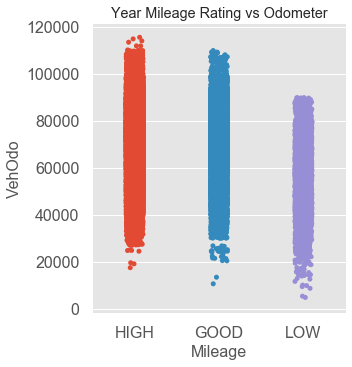

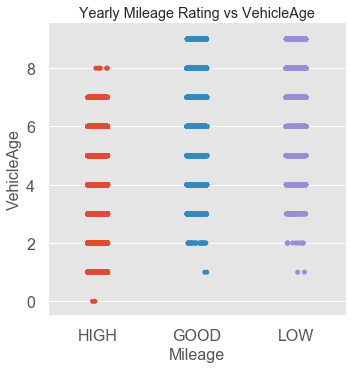

In [56]:
#Miles per year = Odometer Reading / Vehichle age in years
# United States Department of Transportaiton Federal Highway Administration says that 13,467 are the average number of miles driven per year.  
import seaborn as sns
kick_data.VehOdo=kick_data.VehOdo.fillna("0")
kick_data.VehicleAge=kick_data.VehicleAge.fillna("1")
col1 = 'VehOdo'
col2 = 'VehicleAge'
conditions  = [ (kick_data[col1]/kick_data[col2]) <= 10000, ((kick_data[col1]/kick_data[col2]) <= 13467) & ((kick_data[col1]/kick_data[col2]) > 10000), (kick_data[col1]/kick_data[col2]) > 13467 ]
choices     = [ "LOW", 'GOOD', 'HIGH' ]
kick_data["Mileage"] = np.select(conditions, choices, default=np.nan)

#Now let's plot the data
ax1 = sns.catplot(data=kick_data, x="Mileage", y="VehOdo");
plt.title("Year Mileage Rating vs Odometer")
ax2 = sns.catplot(data=kick_data, x="Mileage", y="VehicleAge")
plt.title("Yearly Mileage Rating vs VehicleAge")


From the data above, you can visually see that the oldest cars in the data set have LOW and GOOD mileage ratings which would trigger suspicion that there could be odometer tampering. 
You can also see in the data above that the HIGH rating starts before the LOW and GOOD which says that mileage on the newest cars are exceeding the expected miles per year but
it does not continue as the car reaches the 8 year mark.  This could be evidence of mechanical issues with the vehicles as well.  We don't have they physical inspectiion field for this dataset, so there we cannot validate this any further without outside information which we will talk about in the next section.   

  - Vehicle Cylinder Count 
    
The vehicle cylinder information was not presented in the dataset as a standalone value; it was combined with the model field. Again, we separated that data into a separate field to see if there was any notable information in regards to kicks. We did not see a major difference in the percentage of kicks across the various Cylinder sizes, so we did not include that data in the section.  However, that code and graph can be found in the Appendix.

### 1.8.2 New Features That Can Be Added From Outside Data

 - City
 - State
    
The physical location of the car can sometimes lead to additional maintenance and corrosion. The Zip codes and State were include in the dataset but the city associated with that zip code was not included.  We downloaded the zip code database 
and created the City field from a merging of the datasets.  The intent was see if the City was in a flood zone like Houston, New Orleans or other coastal cities along the Gulf of Mexico or Florida.   To show the relationships that we are exploring we are showing the data by state below. 


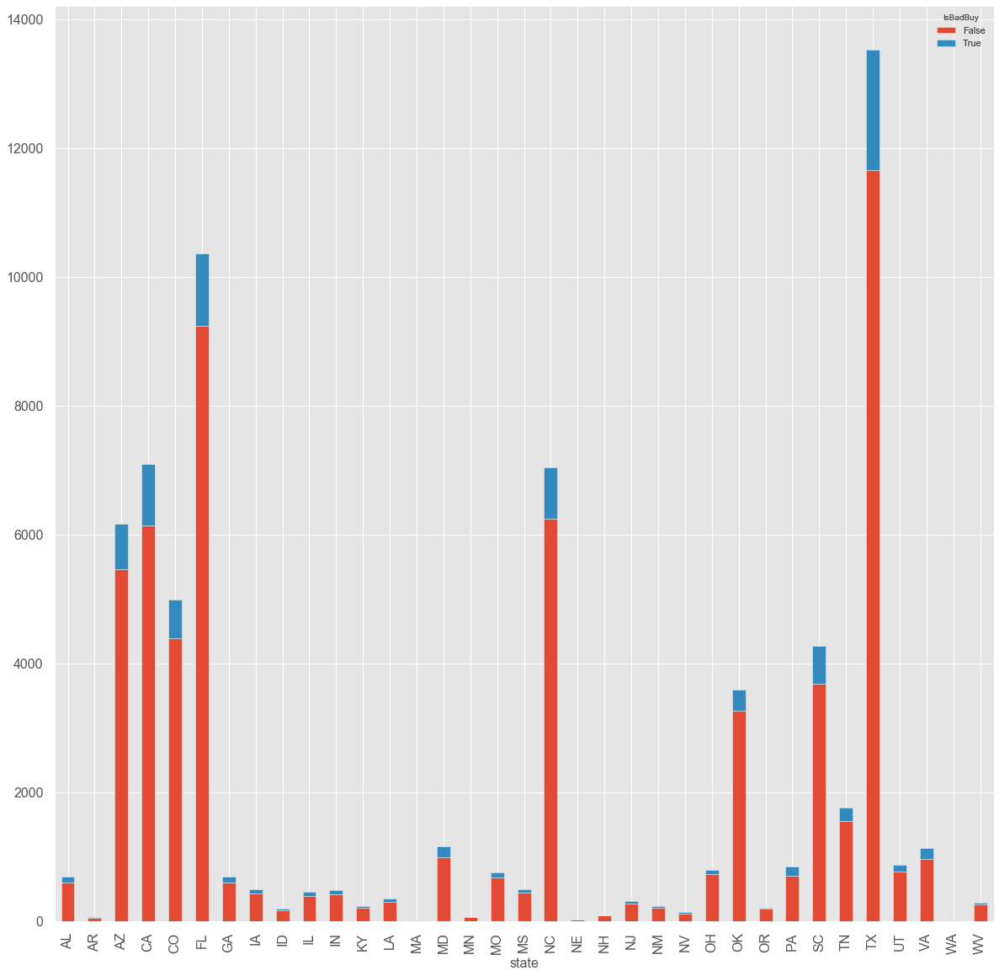

In [57]:
#plt.show()
zip = pd.read_csv('https://www.dropbox.com/s/xg0o3dscrgcp732/uszips.csv?dl=1')
zip=zip[['state_id', 'zip']]
zip.rename(columns = {'state_id' : 'state'}, inplace=True)

kick_imputed_scaled_2 = pd.merge(kick_data, zip, left_on='VNZIP1', right_on='zip', how='left')
kick_imputed_scaled = kick_imputed_scaled_2


city_count = pd.crosstab([kick_imputed_scaled['state']], kick_imputed_scaled.IsBadBuy.astype(bool))
city_count.plot(kind='bar', stacked=True, figsize=(20,20))



The zip codes by state show that Florida, Texas and North Carolina have high "kick" counts than other states.  

### 1.8.3 List of Add-ons That We Would Request From The Client 

 - Car Fax Reports 
    
Car Fax Reports can offer additional information that can be used to determine "kicks".  Accident information and number of owners would be additional data that we would like to investigate if the data were available.   Unfortunately, the dataset does not contain the VIN number so we have no way of referencing this history based on the data provided.   


 - Car VIN Number 
    
The VIN number provides an historical tracking for a given car.  Unfortunately, the dataset does not contain the VIN number so we have no way of referencing this history based on the data provided. If we were performing this analysis for our customer, we would request this information.  

## 1.9 Feature Reduction

### PCA Analysis

We now perform a quick exploratory on feature reduction, by performing principle component analysis. As show below, we are able to describe 98.5% of the variation with 2 principle components. With 3 principle components we can describe 99.6% of the variation.

### LDA Analysis

We also perform a quick Linear Discriminant Analysis for testing prediction. This exploratory is done as a baseline, as it is expected we will iterate through several models for optimizing accuracy and recall. Our overall F-Score is 0.87 for our baseline, scaled model.

In [58]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
%matplotlib inline

In [59]:
#2D PCA Projection
#should be floats

kick_data = pd.read_csv('/Users/chandlervaughn/Dropbox/4. Chandler/Development/git_repositories/DS7331/Lab1/Data/kick.csv')
#drop columns that have too little information to be useful
try:
    kick_data = kick_data.drop(['PRIMEUNIT', 'AUCGUART'],axis=1)
except:
    print("Columns not found. Drop has already been performed.")


#should be floats
continuous_features = ['VehOdo', 'MMRAcquisitionAuctionAveragePrice',
                      'MMRAcquisitionAuctionCleanPrice',
                      'MMRAcquisitionRetailAveragePrice',
                      'MMRAcquisitionRetailCleanPrice',
                      'MMRCurrentAuctionAveragePrice',
                      'MMRCurrentAuctionCleanPrice',
                      'MMRCurrentRetailAveragePrice',
                      'MMRCurrentRetailCleanPrice',
                      'VehBCost',
                      'WarrantyCost']

#should be int
ordinal_features = ['IsBadBuy', 'PurchDate', 'VehYear',
                    'VehicleAge', 'WheelTypeID', 'BYRNO',
                    'VNZIP1', 'IsOnlineSale']

#should be categorical
categorical_features = ['Auction', 'Make', 'Model', 'Trim',
                       'SubModel', 'Color', 'Transmission',
                       'WheelType', 'Nationality', 'Size',
                       'TopThreeAmericanName',# 'PRIMEUNIT','AUCGUART',
                        'VNST']

#replace ? data with Nan so we can properly aggregate
kick_data[continuous_features] = kick_data[continuous_features].replace(to_replace='?', value = -9999999)
kick_data[ordinal_features] = kick_data[ordinal_features].replace(to_replace='?', value = -9999999)
kick_data[categorical_features] = kick_data[categorical_features].replace(to_replace='?', value = 'UNKNOWN')

kick_data[continuous_features] = kick_data[continuous_features].astype(np.float64)
kick_data[ordinal_features] = kick_data[ordinal_features].astype(np.int64)

kick_data[continuous_features] = kick_data[continuous_features].replace(to_replace=-9999999, value = np.nan)
kick_data[ordinal_features] = kick_data[ordinal_features].replace(to_replace=-9999999, value = np.nan)

#Impute missing values

kick_mean = kick_data[continuous_features].mean()
kick_median = kick_data[categorical_features+ordinal_features].median()
cat_series = pd.concat((kick_mean, kick_median))
kick_imputed = kick_data.fillna(value=cat_series)

kick_imputed[continuous_features] = kick_imputed[continuous_features].astype(np.float64)
kick_imputed[ordinal_features] = kick_imputed[ordinal_features].astype(np.int64)
#create a max/min scaler
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
kick_imputed_scaled = kick_imputed

#Dropping correlated values
kick_imputed_scaled = kick_imputed_scaled.drop(['MMRAcquisitionAuctionCleanPrice', 'MMRAcquisitionRetailCleanPrice'], axis=1)
kick_imputed_scaled = kick_imputed_scaled.drop(['MMRCurrentAuctionAveragePrice', 'MMRCurrentRetailAveragePrice'], axis=1)
kick_imputed_scaled = kick_imputed_scaled.drop(['MMRCurrentRetailCleanPrice', 'MMRCurrentAuctionCleanPrice'], axis=1)
#kick_imputed_scaled = kick_imputed_scaled.drop(['MMRAcquisitionRetailAveragePrice'], axis=1)


temp = kick_imputed_scaled

pca_continuous_features = ['VehOdo', 'MMRAcquisitionAuctionAveragePrice',
                      'MMRAcquisitionRetailAveragePrice',
                      'VehBCost',
                      'WarrantyCost']


y = temp.loc[:,['IsBadBuy']].values
x = temp[pca_continuous_features].values



In [60]:
detail_describe(temp).transpose()

,count,nullcounts,mean,std,min,median,max
IsBadBuy,72983,0,0.122988,0.328425,0,0,1
PurchDate,72983,0,1.26309e+09,1.8196e+07,1.23111e+09,1.26403e+09,1.29367e+09
Auction,72983,0,NaN,NaN,ADESA,NaN,OTHER
VehYear,72983,0,2005.34,1.73125,2001,2005,2010
VehicleAge,72983,0,4.17664,1.71221,0,4,9
Make,72983,0,NaN,NaN,ACURA,NaN,VOLVO
Model,72983,0,NaN,NaN,1500 RAM PICKUP 2WD,NaN,ZEPHYR 3.0L V6 SFI
Trim,72983,0,NaN,NaN,1,NaN,s
SubModel,72983,0,NaN,NaN,2D CONVERTIBLE,NaN,WAGON SXT AWD
Color,72983,0,NaN,NaN,BEIGE,NaN,YELLOW


In [61]:
temp.corr()

,IsBadBuy,PurchDate,VehYear,VehicleAge,WheelTypeID,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionRetailAveragePrice,BYRNO,VNZIP1,VehBCost,IsOnlineSale,WarrantyCost
IsBadBuy,1.000000,0.015115,-0.158886,0.167164,-0.111760,0.082560,-0.109245,-0.087413,-0.061488,0.005796,-0.102203,-0.003697,0.052319
PurchDate,0.015115,1.000000,0.211548,0.040119,0.045492,0.133065,0.082693,0.413733,0.087594,-0.030687,0.144366,0.109105,-0.038188
VehYear,-0.158886,0.211548,1.000000,-0.957957,0.256204,-0.283719,0.581079,0.581124,0.280791,0.068276,0.349791,0.057380,-0.268696
VehicleAge,0.167164,0.040119,-0.957957,1.000000,-0.247200,0.319794,-0.565625,-0.460802,-0.268269,-0.074857,-0.311977,-0.024771,0.259310
WheelTypeID,-0.111760,0.045492,0.256204,-0.247200,1.000000,-0.207948,-0.084691,-0.063266,0.181005,0.010382,-0.147717,-0.009470,-0.128585
VehOdo,0.082560,0.133065,-0.283719,0.319794,-0.207948,1.000000,-0.017020,0.031302,-0.288456,-0.053041,-0.060266,0.029556,0.411718
MMRAcquisitionAuctionAveragePrice,-0.109245,0.082693,0.581079,-0.565625,-0.084691,-0.017020,1.000000,0.910391,0.107729,0.045689,0.786067,0.038818,-0.050415
MMRAcquisitionRetailAveragePrice,-0.087413,0.413733,0.581124,-0.460802,-0.063266,0.031302,0.910391,1.000000,0.107511,0.035485,0.743051,0.080627,-0.053442
BYRNO,-0.061488,0.087594,0.280791,-0.268269,0.181005,-0.288456,0.107729,0.107511,1.000000,0.040260,0.046250,-0.142444,-0.086201
VNZIP1,0.005796,-0.030687,0.068276,-0.074857,0.010382,-0.053041,0.045689,0.035485,0.040260,1.000000,0.016733,0.024889,-0.036173


### 2D PCA

In [62]:
pca=PCA(n_components=2)

In [63]:
principalComponents = pca.fit_transform(x)

pdf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
pdf.head(5)

,principal component 1,principal component 2
0,-17552.780809,3603.443698
1,-22092.857484,2485.972845
2,-2319.521070,-3469.751534
3,5887.779716,-6181.482194
4,2115.953641,-2796.130454


In [64]:
fdf = pd.concat([pdf, kick_imputed_scaled[['IsBadBuy']]], axis = 1)
fdf.head(5)

,principal component 1,principal component 2,IsBadBuy
0,-17552.780809,3603.443698,0
1,-22092.857484,2485.972845,0
2,-2319.521070,-3469.751534,0
3,5887.779716,-6181.482194,0
4,2115.953641,-2796.130454,0


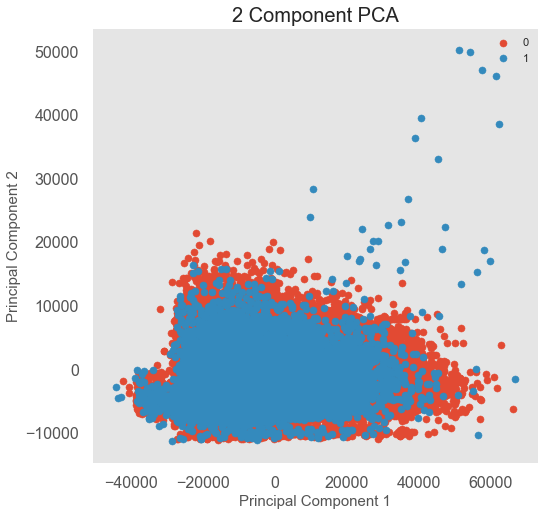

In [65]:
#Lets try this for Age
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)


targets = [0, 1]
for target in targets:
    indicesToKeep = fdf['IsBadBuy'] == target
    ax.scatter(fdf.loc[indicesToKeep, 'principal component 1']
               , fdf.loc[indicesToKeep, 'principal component 2']
               , cmap = 'blues'
               , s = 50)
ax.legend(targets)
ax.grid()

In [66]:
#Together the two principal components explains 
#98.5% of the variation
#Unfortunately they are not well seperated
pca.explained_variance_ratio_

array([0.91636352, 0.07483024])

### 3D PCA


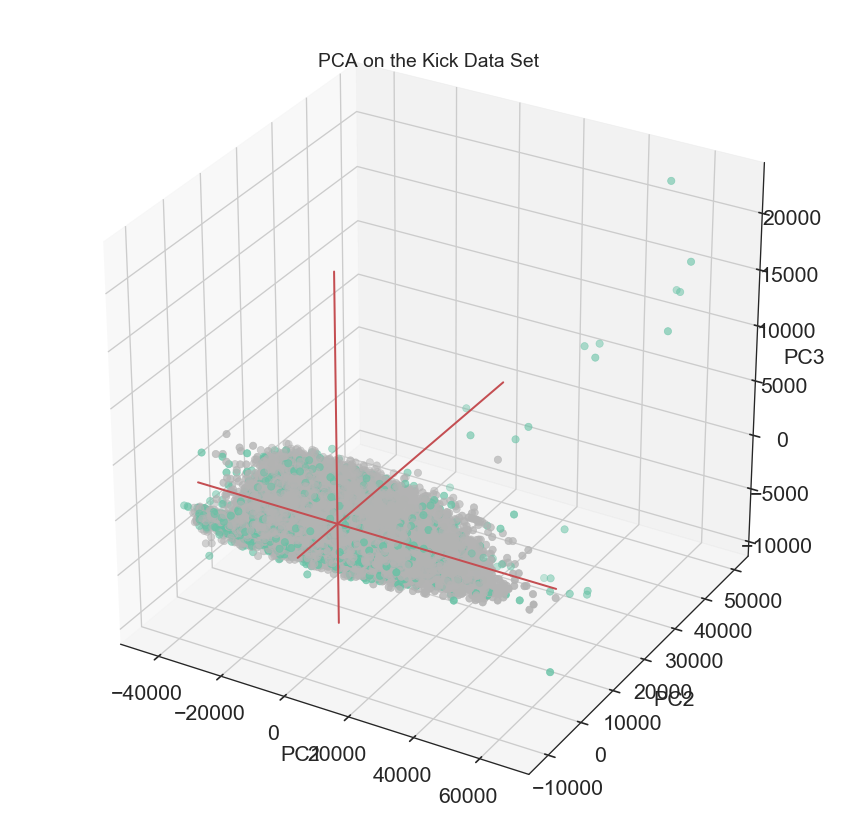

In [67]:
# libraries
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D  

import matplotlib.pyplot as plt


# Get the x dataset
import seaborn as sns
sns.set_style("white")

my_dpi=96
#plt.figure(figsize=(480/my_dpi, 480/my_dpi), dpi=my_dpi)

 
# Run The PCA
pca = PCA(n_components=3)
pca.fit(x)
 
# Store results of PCA in a data frame
result=pd.DataFrame(pca.transform(x), columns=['PCA%i' % i for i in range(3)])
result = pd.concat([result, kick_imputed_scaled[['IsBadBuy']]], axis = 1)

# Plot initialisation
fig = plt.figure(figsize=(1080/my_dpi, 1080/my_dpi), dpi=my_dpi)
ax = fig.add_subplot(111, projection='3d')
ax.scatter(result['PCA0'], result['PCA1'], result['PCA2'], c= result['IsBadBuy'], cmap="Set2_r", s=30)
 
# make simple, bare axis lines through space:
xAxisLine = ((min(result['PCA0']), max(result['PCA0'])), (0, 0), (0,0))
ax.plot(xAxisLine[0], xAxisLine[1], xAxisLine[2], 'r')
yAxisLine = ((0, 0), (min(result['PCA1']), max(result['PCA1'])), (0,0))
ax.plot(yAxisLine[0], yAxisLine[1], yAxisLine[2], 'r')
zAxisLine = ((0, 0), (0,0), (min(result['PCA2']), max(result['PCA2'])))
ax.plot(zAxisLine[0], zAxisLine[1], zAxisLine[2], 'r')
 
# label the axes
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title("PCA on the Kick Data Set")
plt.show()


In [68]:
pca.explained_variance_ratio_

array([0.91636352, 0.07483024, 0.00497757])

### Linear Discriminant Analysis

In [69]:
import pandas as pd
from pydataset import data
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [70]:
#Lets make dummy variables
one_hot_df = pd.concat([pd.get_dummies(kick_imputed_scaled[col],prefix=col) for col in categorical_features], axis=1)

kick_one_hot=pd.concat([kick_imputed_scaled, one_hot_df], axis=1)

In [71]:
y = kick_one_hot['IsBadBuy']

#drop columns that have too little information to be useful
try:
    kick_one_hot = kick_one_hot.drop(['MMRAcquisitionRetailAveragePrice'], axis=1)
except:
    print("Columns not found. Drop has already been performed.")

try:
    kick_one_hot = kick_one_hot.drop(['IsBadBuy'], axis=1)
except:
    print("Columns not found. Drop has already been performed.")
    
try:
    kick_one_hot = kick_one_hot.drop(['VehYear'], axis=1)
except:
    print("Columns not found. Drop has already been performed.")

try:
    kick_one_hot = kick_one_hot.drop(['model_short'], axis=1)
except:
    print("Columns not found. Drop has already been performed.")
    
try:
    kick_one_hot = kick_one_hot.drop(['model_Short'], axis=1)
except:
    print("Columns not found. Drop has already been performed.")

Columns not found. Drop has already been performed.
Columns not found. Drop has already been performed.


In [72]:
x = kick_one_hot.drop(columns=categorical_features)
#Split the data
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.3,random_state=0)

In [73]:
clf = LDA(store_covariance=True)
clf.fit(x_train, y_train)

LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=True, tol=0.0001)

In [74]:
y_pred=clf.predict(x_test)

In [75]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94     19235
           1       0.62      0.29      0.40      2660

    accuracy                           0.89     21895
   macro avg       0.76      0.63      0.67     21895
weighted avg       0.87      0.89      0.87     21895



## Appendix

### A1 Vehicle by Wheel Type

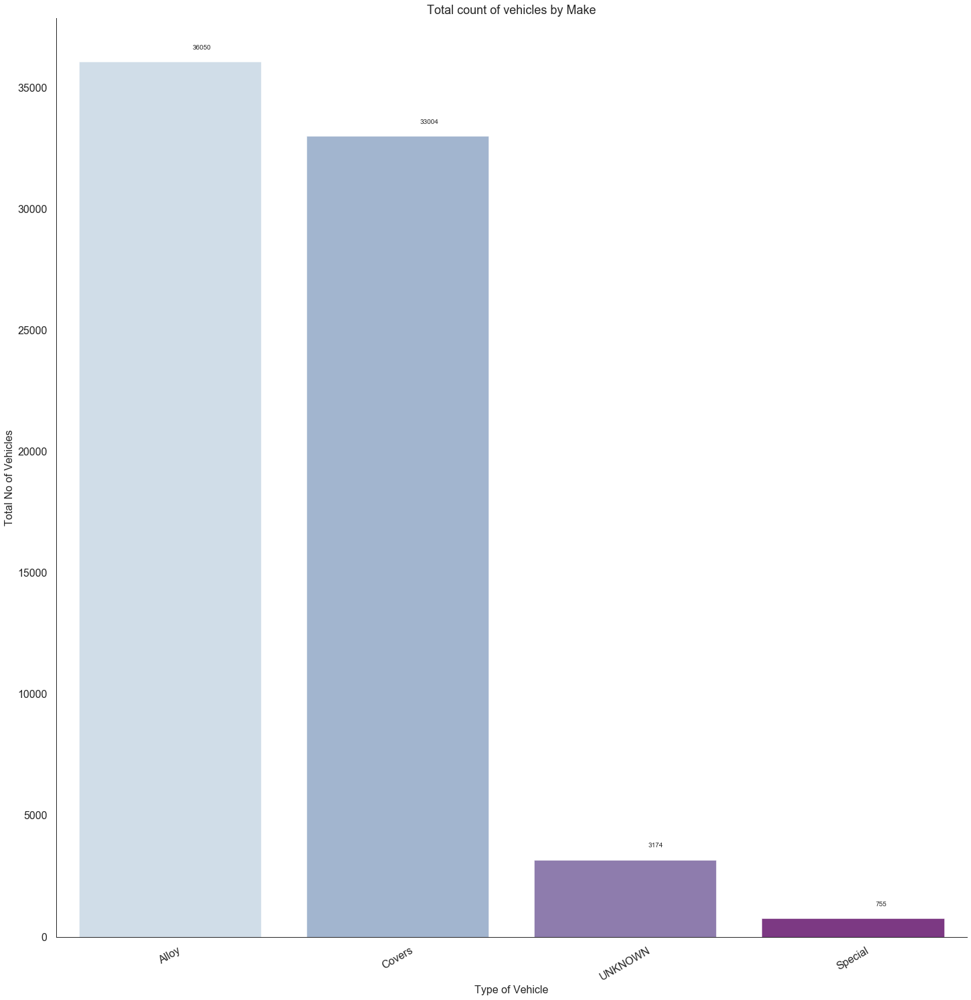

In [76]:
sns.set_style("white")
g = sns.factorplot(x="WheelType", data=kick_imputed_scaled, kind="count",
                   palette="BuPu", size=20, aspect=1)
g.ax.xaxis.set_label_text("Type of Vehicle",fontdict= {'size':16})
g.ax.yaxis.set_label_text("Total No of Vehicles", fontdict= {'size':16})
g.ax.set_title("Total count of vehicles by Make",fontdict= {'size':18})
g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=30)
# to get the counts on the top heads of the bar
for p in g.ax.patches:
    g.ax.annotate((p.get_height()), (p.get_x()+0.5, p.get_height()+500))

### A2 Count plot to show the number of vehicles  by Make

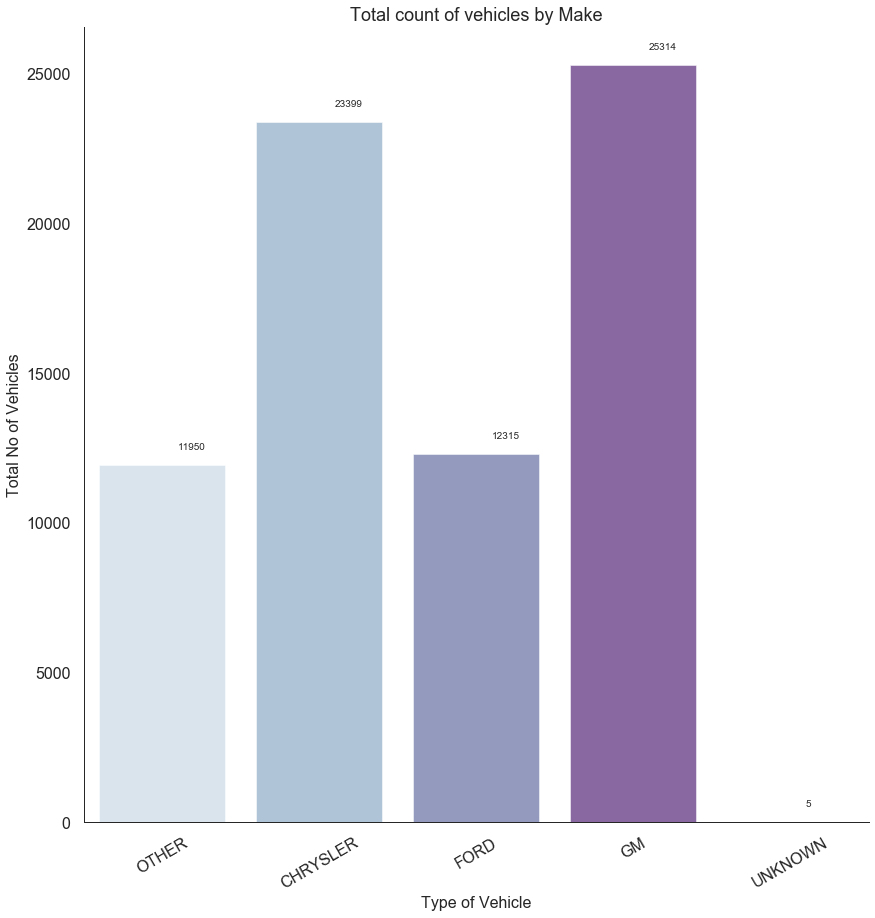

In [77]:

g = sns.set_style("white")
g = sns.factorplot(x="TopThreeAmericanName", data=kick_imputed_scaled, kind="count",
                   palette="BuPu", size=12, aspect=1)
g.ax.xaxis.set_label_text("Type of Vehicle",fontdict= {'size':16})
g.ax.yaxis.set_label_text("Total No of Vehicles", fontdict= {'size':16})
g.ax.set_title("Total count of vehicles by Make",fontdict= {'size':18})
g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=30)
# to get the counts on the top heads of the bar
for p in g.ax.patches:
    g.ax.annotate((p.get_height()), (p.get_x()+0.5, p.get_height()+500))

### A3  Count plot of vehicles  by Make

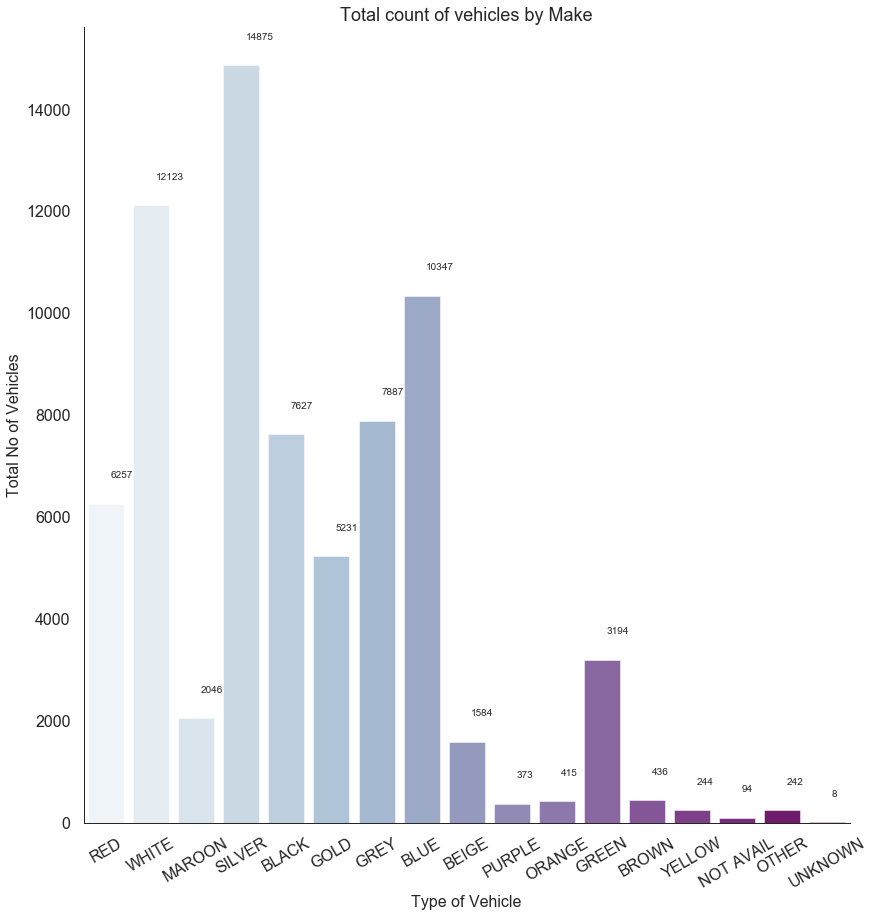

In [78]:
# Count plot to show the number of vehicles  by each Make
sns.set_style("white")
g = sns.factorplot(x="Color", data=kick_imputed_scaled, kind="count",
                   palette="BuPu", size=12, aspect=1)
g.ax.xaxis.set_label_text("Type of Vehicle",fontdict= {'size':16})
g.ax.yaxis.set_label_text("Total No of Vehicles", fontdict= {'size':16})
g.ax.set_title("Total count of vehicles by Make",fontdict= {'size':18})
g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=30)
# to get the counts on the top heads of the bar
for p in g.ax.patches:
    g.ax.annotate((p.get_height()), (p.get_x()+0.5, p.get_height()+500))

### A4 Count plot of vehicles  by Vehicle Size

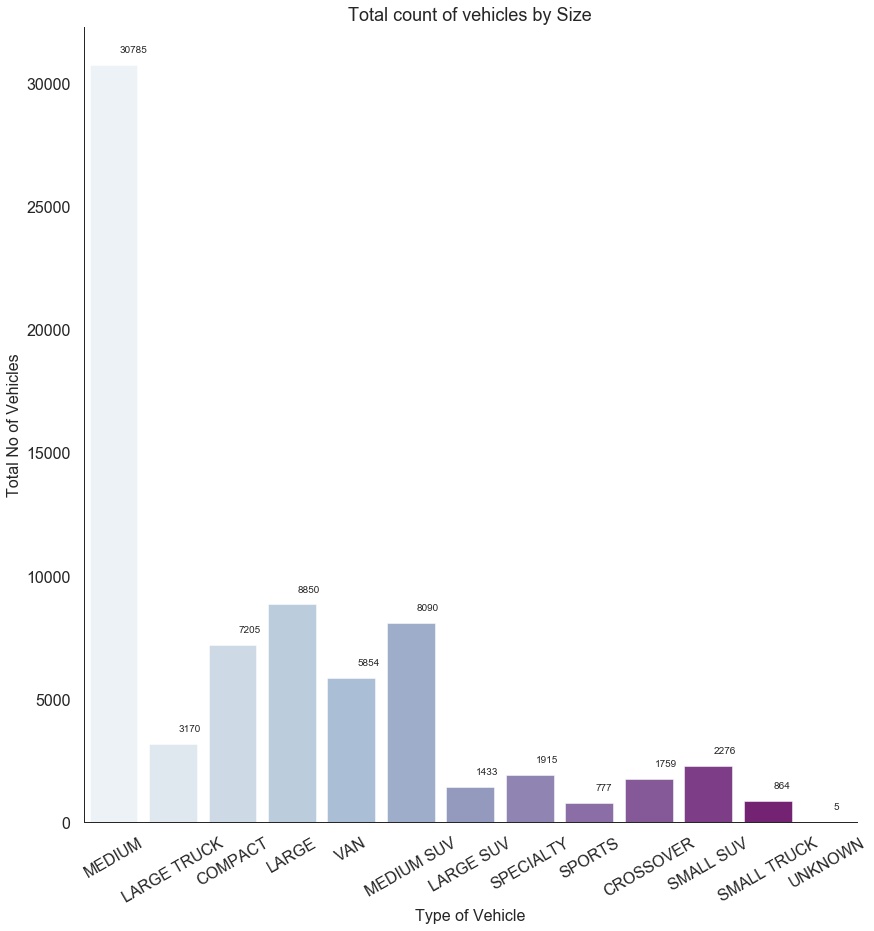

In [79]:
# Count plot to show the number of vehicles  by Vehicle Size
sns.set_style("white")
g = sns.factorplot(x="Size", data=kick_imputed_scaled, kind="count",
                   palette="BuPu", size=12, aspect=1)
g.ax.xaxis.set_label_text("Type of Vehicle",fontdict= {'size':16})
g.ax.yaxis.set_label_text("Total No of Vehicles", fontdict= {'size':16})
g.ax.set_title("Total count of vehicles by Size",fontdict= {'size':18})
g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=30)
# to get the counts on the top heads of the bar
for p in g.ax.patches:
    g.ax.annotate((p.get_height()), (p.get_x()+0.5, p.get_height()+500))

### A5 Count plot of vehicles  by Vehicle Transmission Type

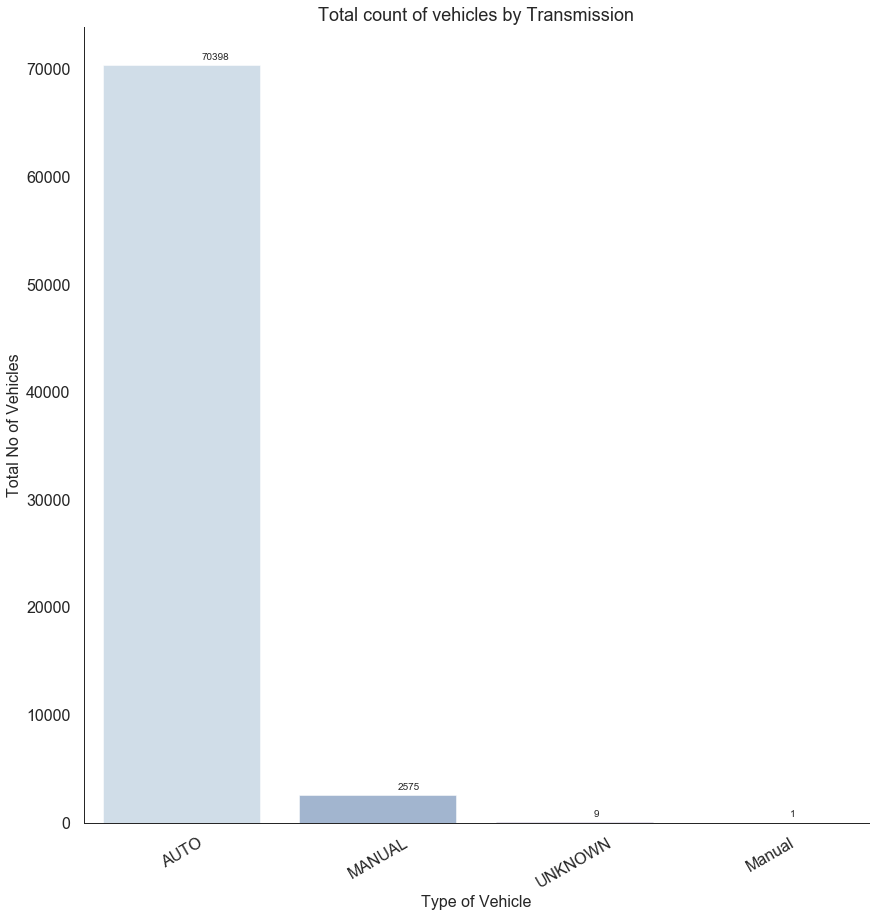

In [80]:
sns.set_style("white")
g = sns.factorplot(x="Transmission", data=kick_imputed_scaled, kind="count",
                   palette="BuPu", size=12, aspect=1)
g.ax.xaxis.set_label_text("Type of Vehicle",fontdict= {'size':16})
g.ax.yaxis.set_label_text("Total No of Vehicles", fontdict= {'size':16})
g.ax.set_title("Total count of vehicles by Transmission",fontdict= {'size':18})
g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=30)
# to get the counts on the top heads of the bar
for p in g.ax.patches:
    g.ax.annotate((p.get_height()), (p.get_x()+0.5, p.get_height()+500))

### A6 Density Distribution Plots

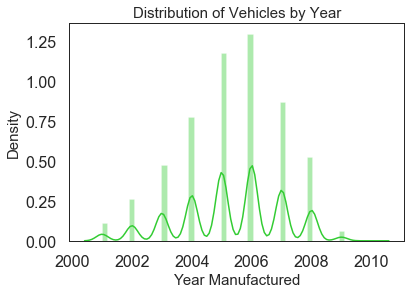

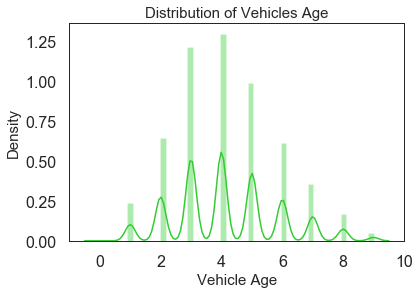

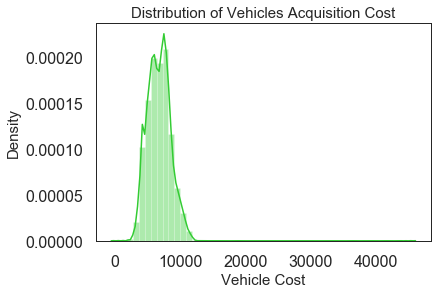

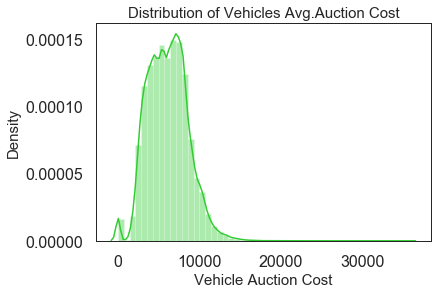

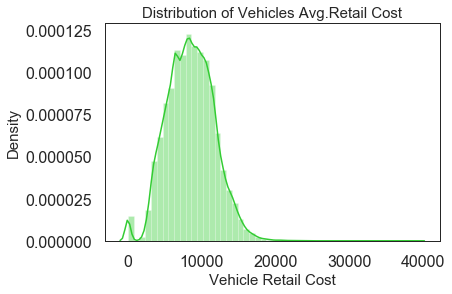

<Figure size 432x288 with 0 Axes>

In [81]:
# Distribution of vehicles based on year 
#plt.figure(1)
#plt.subplot(221)

fig,ax = plt.subplots(figsize=(6,4))
sns.distplot(kick_imputed_scaled["VehYear"], color="#33cc33",kde=True, ax=ax)
ax.set_title('Distribution of Vehicles by Year', fontsize= 15)
plt.ylabel("Density", fontsize= 15)
plt.xlabel("Year Manufactured", fontsize= 15)
plt.show()


fig, ax = plt.subplots(figsize=(6,4))
sns.distplot(kick_imputed_scaled["VehicleAge"], color="#33cc33",kde=True, ax=ax)
ax.set_title('Distribution of Vehicles Age', fontsize= 15)
plt.ylabel("Density", fontsize= 15)
plt.xlabel("Vehicle Age", fontsize= 15)
plt.show()

fig, ax = plt.subplots(figsize=(6,4))
sns.distplot(kick_imputed_scaled["VehBCost"], color="#33cc33",kde=True, ax=ax)
ax.set_title('Distribution of Vehicles Acquisition Cost', fontsize= 15)
plt.ylabel("Density", fontsize= 15)
plt.xlabel("Vehicle Cost", fontsize= 15)
plt.show()

fig, ax = plt.subplots(figsize=(6,4))
sns.distplot(kick_imputed_scaled["MMRAcquisitionAuctionAveragePrice"], color="#33cc33",kde=True, ax=ax)
ax.set_title('Distribution of Vehicles Avg.Auction Cost', fontsize= 15)
plt.ylabel("Density", fontsize= 15)
plt.xlabel("Vehicle Auction Cost", fontsize= 15)
plt.show()

fig, ax = plt.subplots(figsize=(6,4))
sns.distplot(kick_imputed_scaled["MMRAcquisitionRetailAveragePrice"], color="#33cc33",kde=True, ax=ax)
ax.set_title('Distribution of Vehicles Avg.Retail Cost', fontsize= 15)
plt.ylabel("Density", fontsize= 15)
plt.xlabel("Vehicle Retail Cost", fontsize= 15)
plt.show()

plt.tight_layout()
plt.show()

### A7 Vehicle Cylinders Vs. BadBuy?

<Figure size 480x480 with 0 Axes>

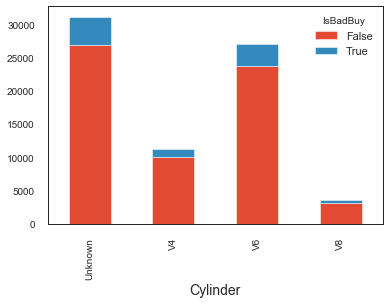

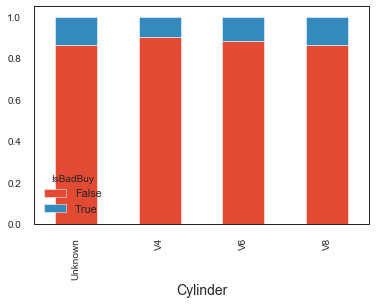

In [82]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(6,6), dpi=80, facecolor='w', edgecolor='k')
plt.rcParams["axes.labelsize"] = 14
plt.rcParams["xtick.labelsize"]= 10
plt.rcParams["ytick.labelsize"]= 10
#plt.rc("Legend", fontsize=32)

temp=kick_imputed.Model.fillna("0")
kick_imputed['Cylinder'] = pd.np.where(temp.str.contains("V6"),"V6",
                   pd.np.where(temp.str.contains("6C"), "V6",
                   pd.np.where(temp.str.contains("4C"), "V4", 
                   pd.np.where(temp.str.contains("8C"), "V8",            
                   pd.np.where(temp.str.contains("V4"), "V4",
                   pd.np.where(temp.str.contains("V8"), "V8", "Unknown"))))))
                
CylinderVal_count = pd.crosstab([kick_imputed['Cylinder']], kick_imputed.IsBadBuy.astype(bool))
CylinderVal_count.plot(kind='bar', stacked=True)
plt.show()

kick_rate_by_cyl = CylinderVal_count.div(CylinderVal_count.sum(1).astype(float),axis=0)
kick_rate_by_cyl.plot(kind='bar', stacked=True)